In [1]:
import pandas as pd

# Load the datasets
profiles_df = pd.read_csv("C://Users//Bhargavi//Downloads//linkedin_profiles.csv")
jobs_df = pd.read_csv("C://Users//Bhargavi//Downloads//linkedin_job_postings.csv")

# Display the first few rows of both datasets to check if they are loaded correctly
print(profiles_df.head())
print(jobs_df.head())


   Profile ID            Name          Job Title    Company  \
0         101      Zane Davis     Data Scientist     Google   
1         102    Sam Williams  Marketing Manager     Amazon   
2         103    Jack Johnson  Software Engineer  Microsoft   
3         104  Alice Anderson         HR Manager   Facebook   
4         105     Zane Miller       Data Analyst    Netflix   

            Location                     Skills  Endorsements Connections  \
0      New York, USA   Python, Machine Learning            75        500+   
1       Seattle, USA             Marketing, SEO            45         300   
2         London, UK      Java, Cloud Computing            60         400   
3  San Francisco, CA  HR Management, Leadership            50        500+   
4   Los Angeles, USA        SQL, Tableau, Excel            80         250   

        Industry  Experience (Years)                Education  
0           Tech                   5      MSc in Data Science  
1     E-commerce              

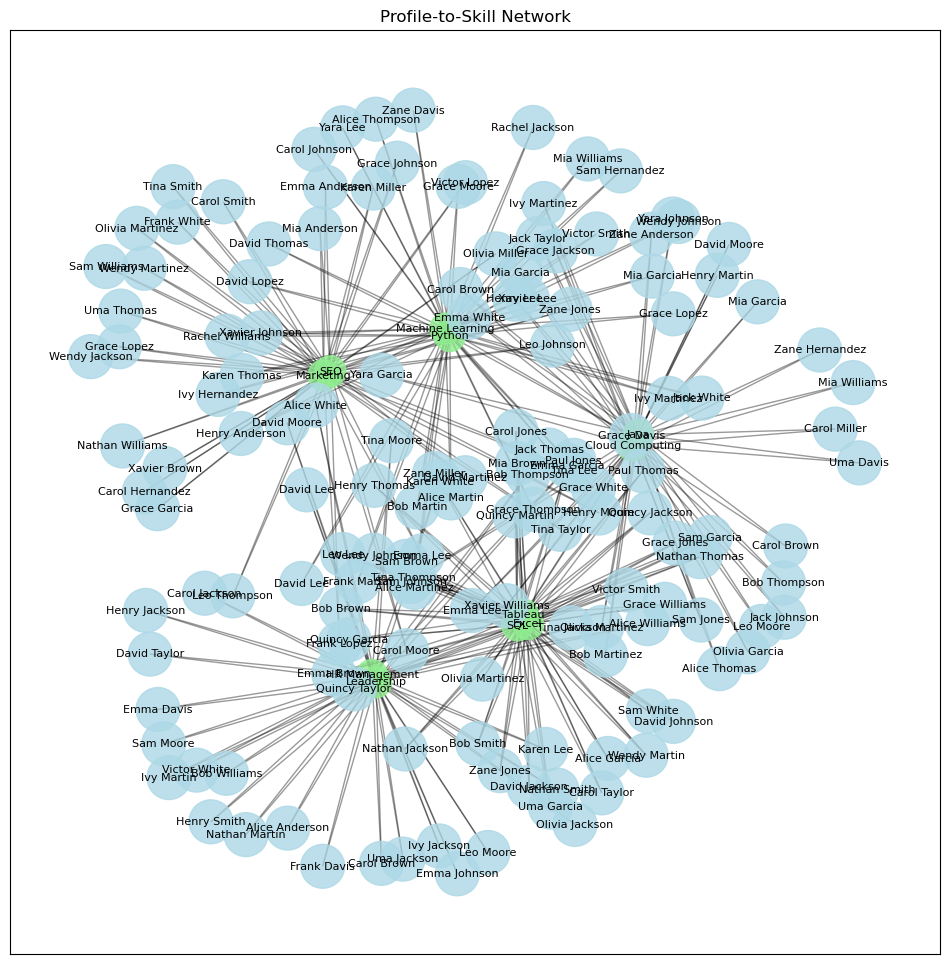

In [39]:
import networkx as nx
import matplotlib.pyplot as plt

# Initialize a new graph for the Profile-to-Skill network
G = nx.Graph()

# Add nodes and edges between profiles and skills
for index, row in profiles_df.iterrows():
    skills = row['Skills'].split(', ')  # Split skills by comma
    profile_id = row['Profile ID']
    
    # Add the profile node
    G.add_node(profile_id, label=row['Name'], type='profile')
    
    # Add edges between the profile and each skill
    for skill in skills:
        G.add_node(skill, label=skill, type='skill')  # Add skill as a node
        G.add_edge(profile_id, skill)  # Connect profile to the skill

# Visualize the Profile-to-Skill Network using spring layout
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, k=0.5, seed=42)

# Draw nodes with different sizes for profiles and skills
node_sizes = [1000 if G.nodes[node]['type'] == 'profile' else 500 for node in G.nodes()]
node_colors = ['lightblue' if G.nodes[node]['type'] == 'profile' else 'lightgreen' for node in G.nodes()]

# Draw the nodes, edges, and labels
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=node_colors, alpha=0.8)
nx.draw_networkx_edges(G, pos, alpha=0.4)
nx.draw_networkx_labels(G, pos, labels={n: G.nodes[n]['label'] for n in G.nodes()}, font_size=8)

plt.title('Profile-to-Skill Network')
plt.show()


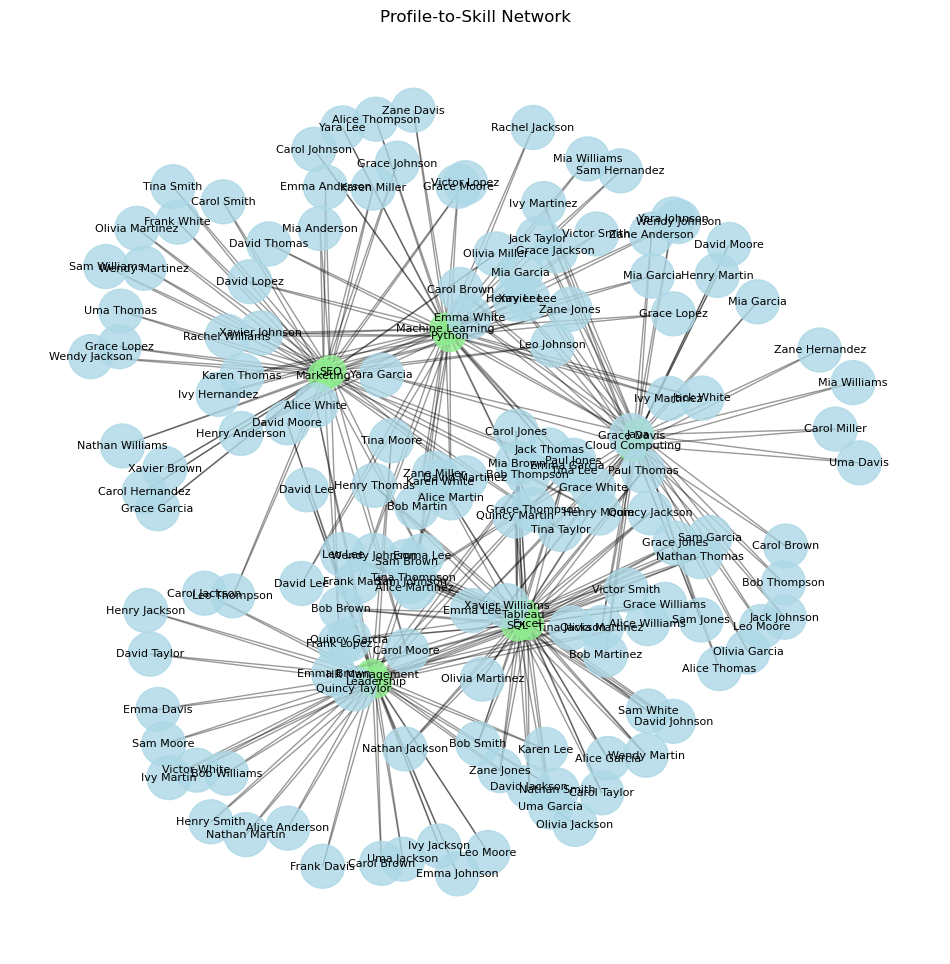

The network consists of 150 unique profiles, indicating a diverse range of individuals.
There are 11 unique skills represented in the network, highlighting the variety of competencies possessed by the profiles.
This diverse skill set suggests a rich talent pool available for various job roles.
The connections between profiles and skills indicate the competencies that are most commonly sought in the industry.


In [45]:
import networkx as nx
import matplotlib.pyplot as plt

# Initialize a new graph for the Profile-to-Skill network
G = nx.Graph()

# Add nodes and edges between profiles and skills
for index, row in profiles_df.iterrows():
    skills = row['Skills'].split(', ')  # Split skills by comma
    profile_id = row['Profile ID']
    
    # Add the profile node
    G.add_node(profile_id, label=row['Name'], type='profile')
    
    # Add edges between the profile and each skill
    for skill in skills:
        G.add_node(skill, label=skill, type='skill')  # Add skill as a node
        G.add_edge(profile_id, skill)  # Connect profile to the skill

# Visualize the Profile-to-Skill Network using spring layout
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, k=0.5, seed=42)

# Draw nodes with different sizes for profiles and skills
node_sizes = [1000 if G.nodes[node]['type'] == 'profile' else 500 for node in G.nodes()]
node_colors = ['lightblue' if G.nodes[node]['type'] == 'profile' else 'lightgreen' for node in G.nodes()]

# Draw the nodes, edges, and labels
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=node_colors, alpha=0.8)
nx.draw_networkx_edges(G, pos, alpha=0.4)
nx.draw_networkx_labels(G, pos, labels={n: G.nodes[n]['label'] for n in G.nodes()}, font_size=8)

plt.title('Profile-to-Skill Network')
plt.axis('off')  # Hide the axes
plt.show()

# Function to analyze the Profile-to-Skill network
def analyze_profile_skill_network(G):
    # Count unique profiles and skills
    profile_count = len({n for n, d in G.nodes(data=True) if d['type'] == 'profile'})
    skill_count = len({n for n, d in G.nodes(data=True) if d['type'] == 'skill'})
    
    # Generate conclusions based on node counts
    conclusions = generate_profile_skill_conclusions(profile_count, skill_count)
    for statement in conclusions:
        print(statement)

def generate_profile_skill_conclusions(profile_count, skill_count):
    conclusions = []
    
    conclusions.append(f"The network consists of {profile_count} unique profiles, indicating a diverse range of individuals.")
    conclusions.append(f"There are {skill_count} unique skills represented in the network, highlighting the variety of competencies possessed by the profiles.")
    conclusions.append("This diverse skill set suggests a rich talent pool available for various job roles.")
    conclusions.append("The connections between profiles and skills indicate the competencies that are most commonly sought in the industry.")
    
    return conclusions

# Call the analysis function on your graph
analyze_profile_skill_network(G)


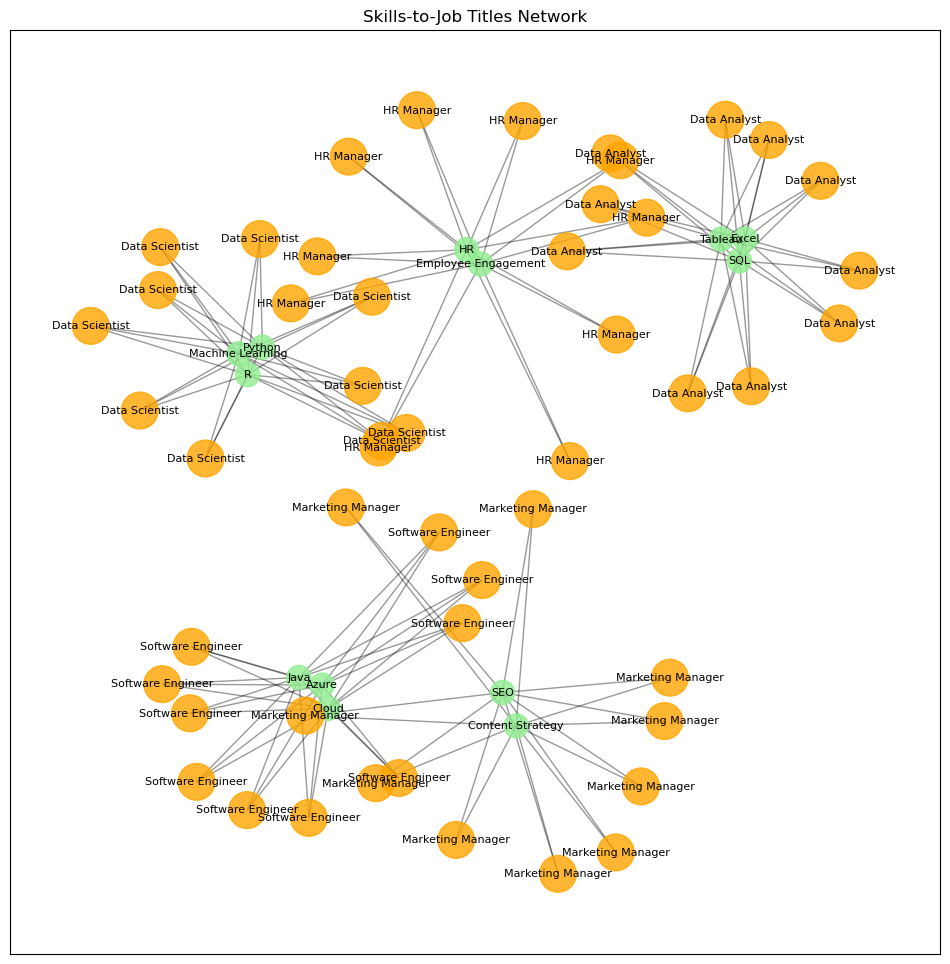

In [43]:
# Initialize a new graph for the Job-to-Skill network
G_jobs = nx.Graph()

# Add nodes and edges between job postings and required skills
for index, row in jobs_df.iterrows():
    skills = row['Required Skills'].split(', ')  # Split required skills by comma
    job_id = row['Job ID']
    
    # Add the job posting node
    G_jobs.add_node(job_id, label=row['Job Title'], type='job')
    
    # Add edges between the job posting and each skill
    for skill in skills:
        G_jobs.add_node(skill, label=skill, type='skill')  # Add skill as a node
        G_jobs.add_edge(job_id, skill)  # Connect job posting to the skill

# Visualize the Job-to-Skill Network using spring layout
plt.figure(figsize=(12, 12))
pos_jobs = nx.spring_layout(G_jobs, k=0.5, seed=42)

# Draw nodes with different sizes for jobs and skills
node_sizes_jobs = [700 if G_jobs.nodes[node]['type'] == 'job' else 300 for node in G_jobs.nodes()]
node_colors_jobs = ['orange' if G_jobs.nodes[node]['type'] == 'job' else 'lightgreen' for node in G_jobs.nodes()]

# Draw the nodes, edges, and labels
nx.draw_networkx_nodes(G_jobs, pos_jobs, node_size=node_sizes_jobs, node_color=node_colors_jobs, alpha=0.8)
nx.draw_networkx_edges(G_jobs, pos_jobs, alpha=0.4)
nx.draw_networkx_labels(G_jobs, pos_jobs, labels={n: G_jobs.nodes[n]['label'] for n in G_jobs.nodes()}, font_size=8)

plt.title('Skills-to-Job Titles Network')
plt.show()


In [4]:
# Degree centrality for profiles in Profile-to-Skill network
degree_centrality = nx.degree_centrality(G)
top_profiles = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:5]

# Print top 5 most connected nodes (profiles or skills)
print("Top 5 Profiles or Skills by Degree Centrality:")
for node, centrality in top_profiles:
    print(f"Node: {G.nodes[node]['label']} - Centrality: {centrality}")

# Degree centrality for jobs in Job-to-Skill network
degree_centrality_jobs = nx.degree_centrality(G_jobs)
top_jobs = sorted(degree_centrality_jobs.items(), key=lambda x: x[1], reverse=True)[:5]

# Print top 5 most connected nodes (jobs or skills)
print("Top 5 Jobs or Skills by Degree Centrality:")
for node, centrality in top_jobs:
    print(f"Node: {G_jobs.nodes[node]['label']} - Centrality: {centrality}")


Top 5 Profiles or Skills by Degree Centrality:
Node: Python - Centrality: 0.1875
Node: Machine Learning - Centrality: 0.1875
Node: Marketing - Centrality: 0.1875
Node: SEO - Centrality: 0.1875
Node: Java - Centrality: 0.1875
Top 5 Jobs or Skills by Degree Centrality:
Node: Python - Centrality: 0.16129032258064516
Node: R - Centrality: 0.16129032258064516
Node: Machine Learning - Centrality: 0.16129032258064516
Node: SEO - Centrality: 0.16129032258064516
Node: Content Strategy - Centrality: 0.16129032258064516


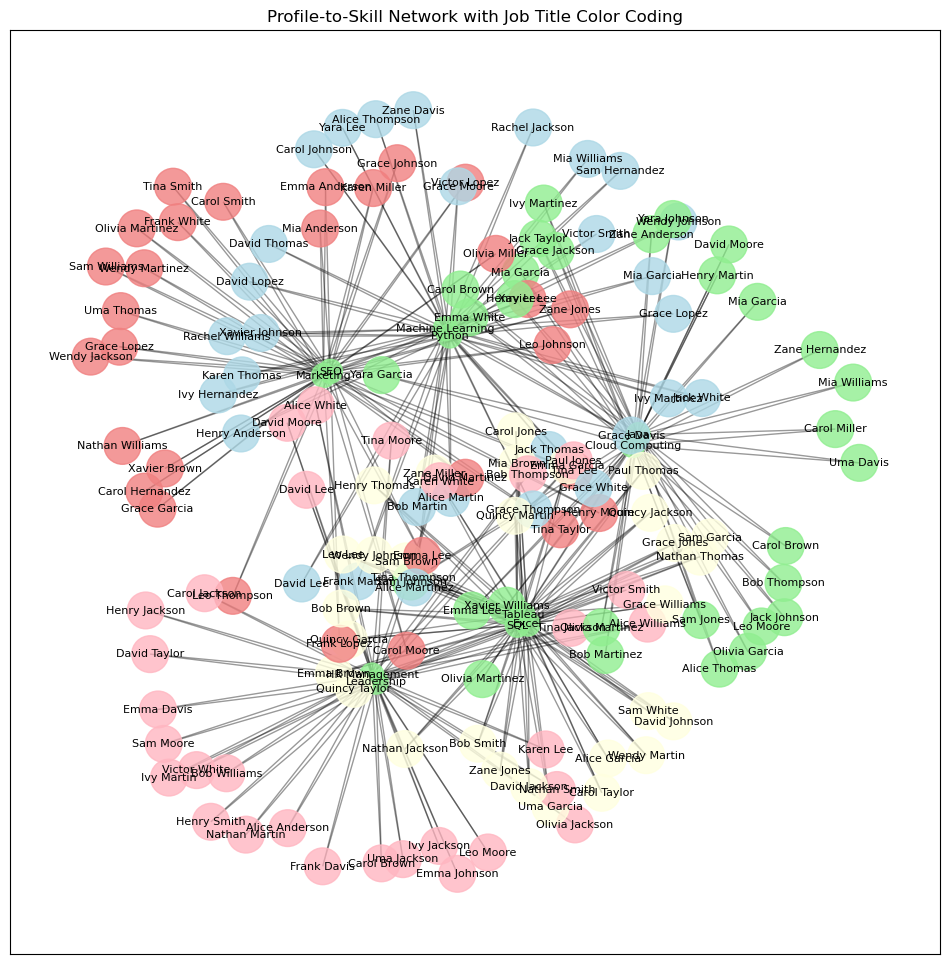

In [5]:
# Define a color mapping for different job titles
color_map = {
    'Data Scientist': 'lightblue',
    'Marketing Manager': 'lightcoral',
    'Software Engineer': 'lightgreen',
    'HR Manager': 'lightpink',
    'Data Analyst': 'lightyellow'
}

# Initialize the network graph again
G = nx.Graph()

# Add nodes and edges between profiles and their skills
for index, row in profiles_df.iterrows():
    skills = row['Skills'].split(', ')  # Split skills by comma
    profile_id = row['Profile ID']
    
    # Add the profile node with color based on job title
    G.add_node(profile_id, label=row['Name'], type='profile', color=color_map.get(row['Job Title'], 'gray'))
    
    # Add edges between the profile and each skill
    for skill in skills:
        G.add_node(skill, label=skill, type='skill', color='lightgreen')  # Skills are always light green
        G.add_edge(profile_id, skill)

# Visualize the network
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, k=0.5, seed=42)

# Draw the nodes with specific color coding based on job titles
node_colors = [G.nodes[node]['color'] for node in G.nodes()]
node_sizes = [700 if G.nodes[node]['type'] == 'profile' else 300 for node in G.nodes()]

# Draw the graph
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=node_colors, alpha=0.8)
nx.draw_networkx_edges(G, pos, alpha=0.4)
nx.draw_networkx_labels(G, pos, labels={n: G.nodes[n]['label'] for n in G.nodes()}, font_size=8)

plt.title('Profile-to-Skill Network with Job Title Color Coding')
plt.show()


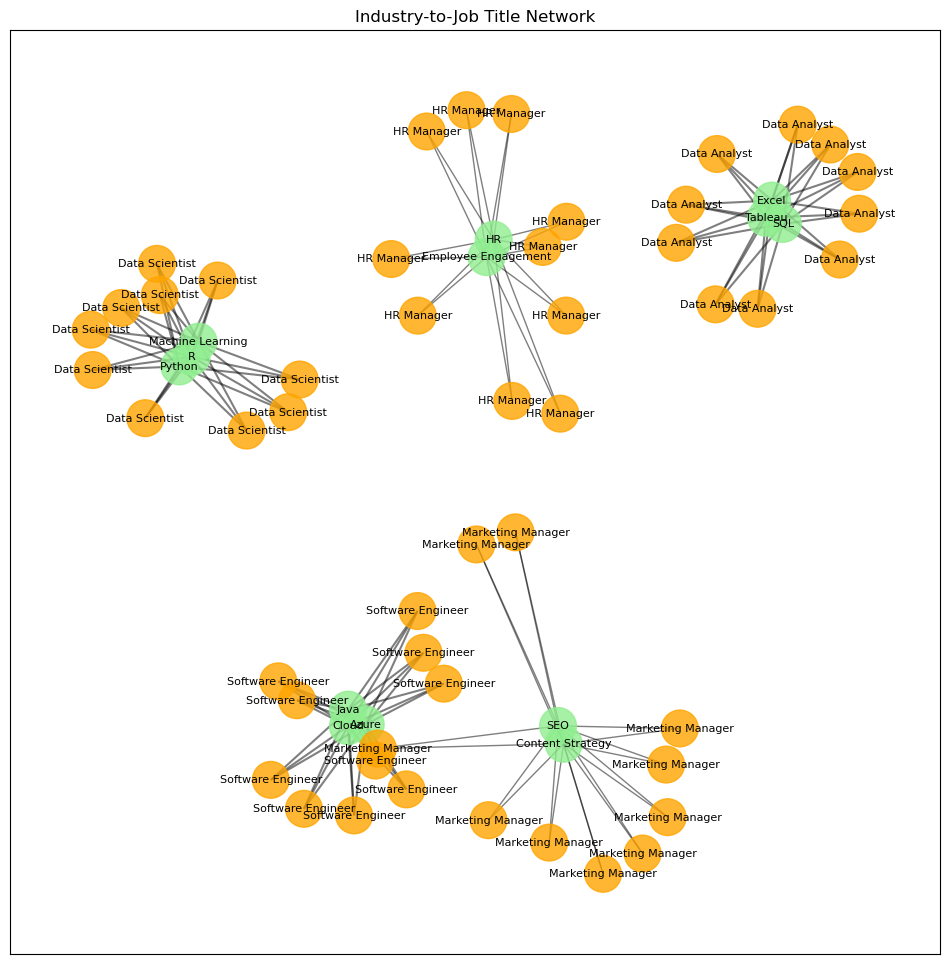

In [13]:
# Initialize the graph for Job-to-Skill network
G_jobs = nx.Graph()

# Add nodes and edges between job postings and their required skills
for index, row in jobs_df.iterrows():
    skills = row['Required Skills'].split(', ')  # Split skills by comma
    job_id = row['Job ID']
    
    # Add the job posting node
    G_jobs.add_node(job_id, label=row['Job Title'], type='job', color='orange')
    
    # Add edges between the job posting and each skill
    for skill in skills:
        G_jobs.add_node(skill, label=skill, type='skill', color='lightgreen')
        G_jobs.add_edge(job_id, skill, weight=len(skills))  # Weight based on number of skills

# Visualize the Job-to-Skill Network with edge thickness
plt.figure(figsize=(12, 12))
pos_jobs = nx.spring_layout(G_jobs, k=0.5, seed=42)

# Edge thickness is proportional to the number of skills required
edge_weights = [G_jobs.edges[edge]['weight'] * 0.5 for edge in G_jobs.edges()]

# Draw the nodes and edges
nx.draw_networkx_nodes(G_jobs, pos_jobs, node_size=700, node_color=[G_jobs.nodes[node]['color'] for node in G_jobs.nodes()], alpha=0.8)
nx.draw_networkx_edges(G_jobs, pos_jobs, width=edge_weights, alpha=0.5)
nx.draw_networkx_labels(G_jobs, pos_jobs, labels={n: G_jobs.nodes[n]['label'] for n in G_jobs.nodes()}, font_size=8)

plt.title('Industry-to-Job Title Network')
plt.show()


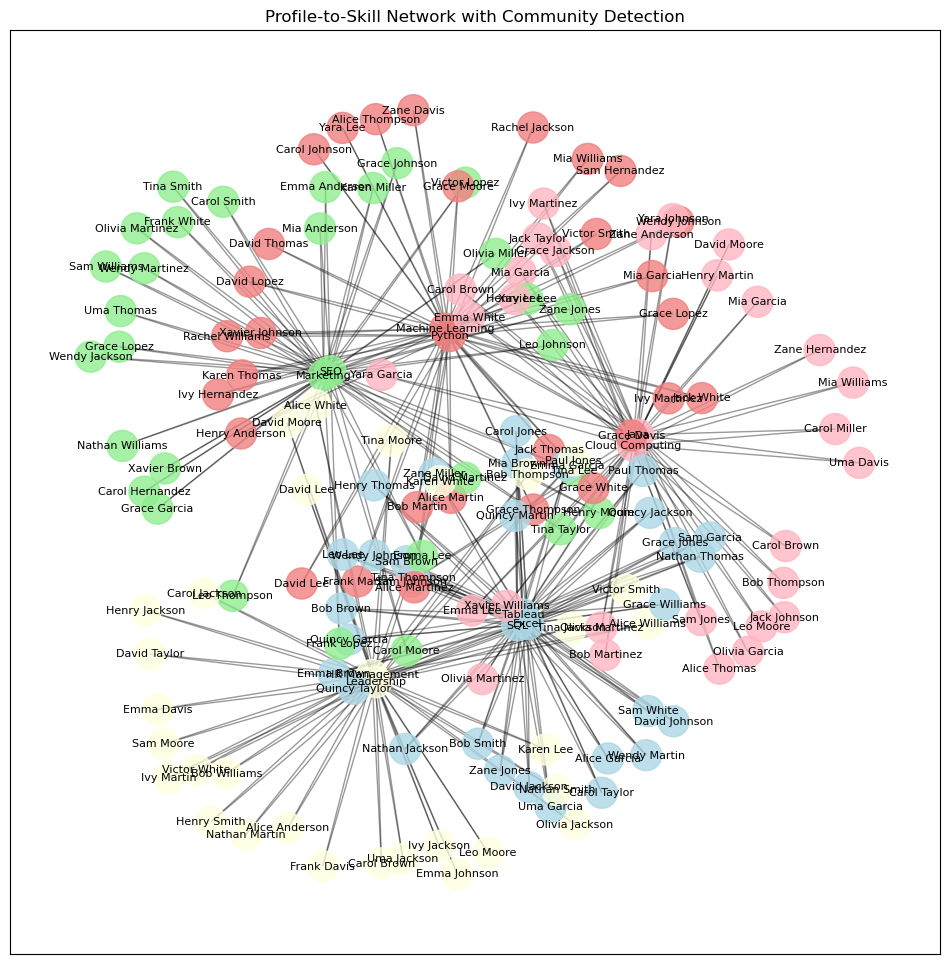

In [8]:
from networkx.algorithms import community

# Convert all nodes (both profiles and skills) to integers or use tuples (ID, type)
G_numeric = nx.Graph()

# Create a mapping for profiles and skills to integers
node_id = 1
node_mapping = {}  # Store the integer mapping for original nodes
reverse_mapping = {}  # Reverse mapping to keep track of original node names

for index, row in profiles_df.iterrows():
    profile_node = f"profile_{row['Profile ID']}"
    node_mapping[profile_node] = node_id
    reverse_mapping[node_id] = row['Name']  # Store reverse mapping for labeling later
    G_numeric.add_node(node_id, type='profile')
    node_id += 1

    skills = row['Skills'].split(', ')
    for skill in skills:
        skill_node = f"skill_{skill}"
        if skill_node not in node_mapping:
            node_mapping[skill_node] = node_id
            reverse_mapping[node_id] = skill
            G_numeric.add_node(node_id, type='skill')
            node_id += 1
        
        # Add an edge between the profile and the skill
        G_numeric.add_edge(node_mapping[profile_node], node_mapping[skill_node])

# Now perform community detection on G_numeric with integer nodes
communities = community.greedy_modularity_communities(G_numeric)

# Assign colors to each community
community_colors = ['lightblue', 'lightcoral', 'lightgreen', 'lightpink', 'lightyellow', 'lightgray', 'lightpurple']
community_mapping = {}

# Assign a color to each node based on the community it belongs to
for idx, comm in enumerate(communities):
    for node in comm:
        community_mapping[node] = community_colors[idx % len(community_colors)]

# Draw the community-based network with correct node labels
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G_numeric, k=0.5, seed=42)

# Draw nodes and edges with color-coded communities
node_colors_community = [community_mapping[node] for node in G_numeric.nodes()]
nx.draw_networkx_nodes(G_numeric, pos, node_size=500, node_color=node_colors_community, alpha=0.8)
nx.draw_networkx_edges(G_numeric, pos, alpha=0.4)
nx.draw_networkx_labels(G_numeric, pos, labels={n: reverse_mapping[n] for n in G_numeric.nodes()}, font_size=8)

plt.title('Profile-to-Skill Network with Community Detection')
plt.show()


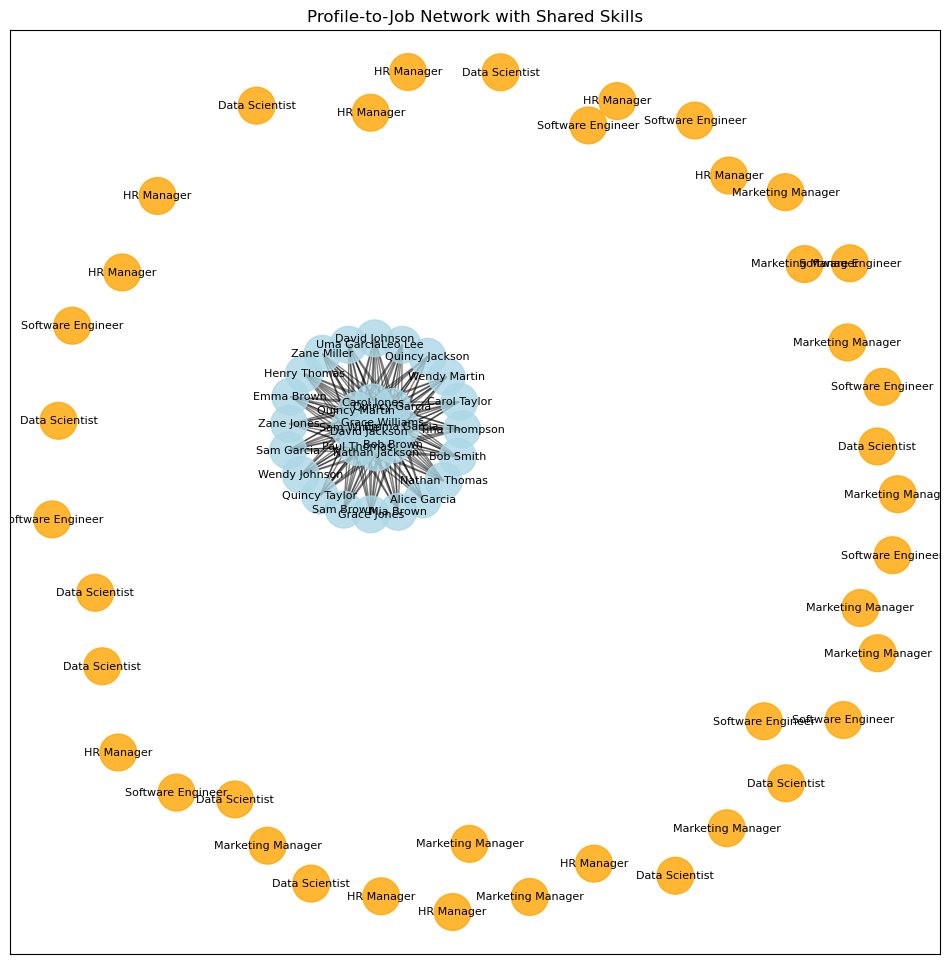

In [9]:
# Initialize a new graph for the Profile-to-Job network
G_profile_jobs = nx.Graph()

# Connect profiles to jobs based on matching skills
for index, job_row in jobs_df.iterrows():
    required_skills = set(job_row['Required Skills'].split(', '))
    job_id = job_row['Job ID']
    
    # Add the job posting node
    G_profile_jobs.add_node(job_id, label=job_row['Job Title'], type='job', color='orange')
    
    # Check profiles for matching skills
    for index, profile_row in profiles_df.iterrows():
        profile_skills = set(profile_row['Skills'].split(', '))
        profile_id = profile_row['Profile ID']
        
        # If the profile has all the required skills for the job, connect them
        if required_skills.issubset(profile_skills):
            G_profile_jobs.add_node(profile_id, label=profile_row['Name'], type='profile', color='lightblue')
            G_profile_jobs.add_edge(profile_id, job_id)

# Visualize the Profile-to-Job Network
plt.figure(figsize=(12, 12))
pos_profile_jobs = nx.spring_layout(G_profile_jobs, k=0.5, seed=42)

# Draw nodes and edges
node_colors_profile_jobs = [G_profile_jobs.nodes[node]['color'] for node in G_profile_jobs.nodes()]
nx.draw_networkx_nodes(G_profile_jobs, pos_profile_jobs, node_size=700, node_color=node_colors_profile_jobs, alpha=0.8)
nx.draw_networkx_edges(G_profile_jobs, pos_profile_jobs, alpha=0.5)
nx.draw_networkx_labels(G_profile_jobs, pos_profile_jobs, labels={n: G_profile_jobs.nodes[n]['label'] for n in G_profile_jobs.nodes()}, font_size=8)

plt.title('Profile-to-Job Network with Shared Skills')
plt.show()


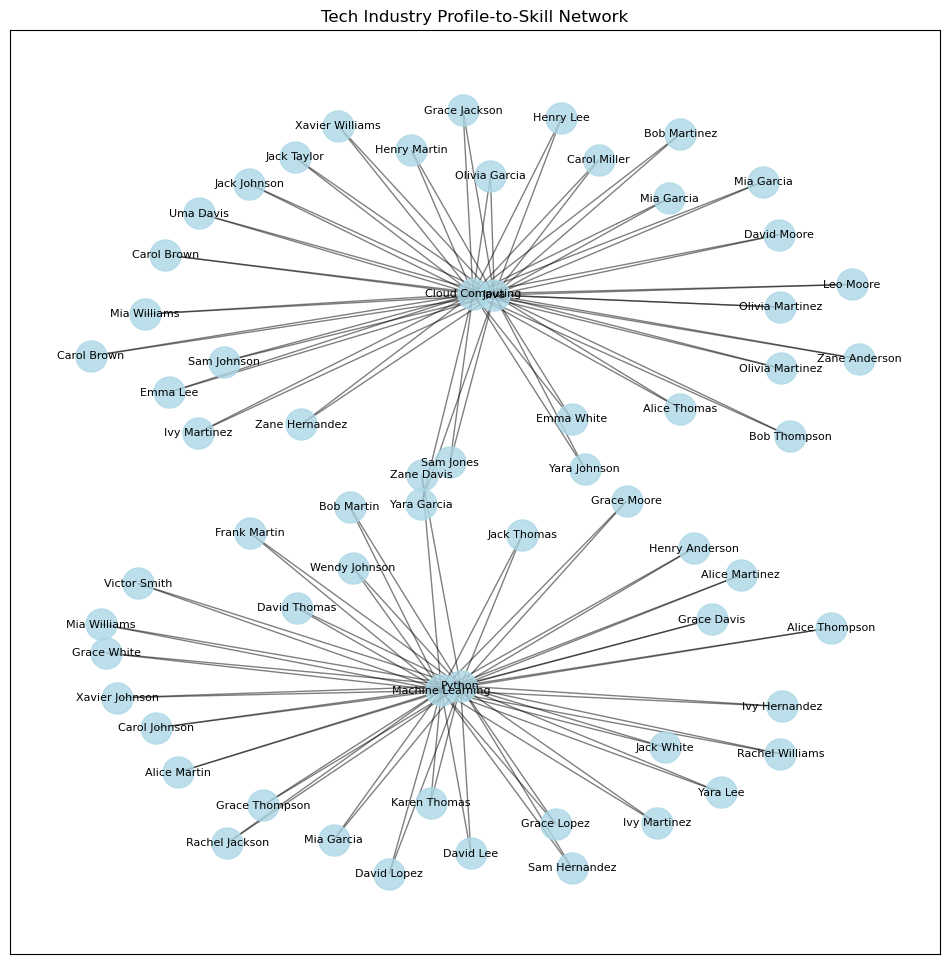

In [10]:
# Filter profiles by industry (e.g., Tech industry)
tech_profiles_df = profiles_df[profiles_df['Industry'] == 'Tech']

# Initialize a new graph for the filtered Profile-to-Skill network
G_tech = nx.Graph()

# Add nodes and edges between profiles and skills for only "Tech" industry profiles
for index, row in tech_profiles_df.iterrows():
    skills = row['Skills'].split(', ')
    profile_id = row['Profile ID']
    
    # Add the profile node
    G_tech.add_node(profile_id, label=row['Name'], type='profile')
    
    # Add edges between the profile and each skill
    for skill in skills:
        G_tech.add_node(skill, label=skill, type='skill')
        G_tech.add_edge(profile_id, skill)

# Visualize the filtered network
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G_tech, k=0.5, seed=42)

# Draw nodes and edges
nx.draw_networkx_nodes(G_tech, pos, node_size=500, node_color='lightblue', alpha=0.8)
nx.draw_networkx_edges(G_tech, pos, alpha=0.5)
nx.draw_networkx_labels(G_tech, pos, labels={n: G_tech.nodes[n]['label'] for n in G_tech.nodes()}, font_size=8)

plt.title('Tech Industry Profile-to-Skill Network')
plt.show()


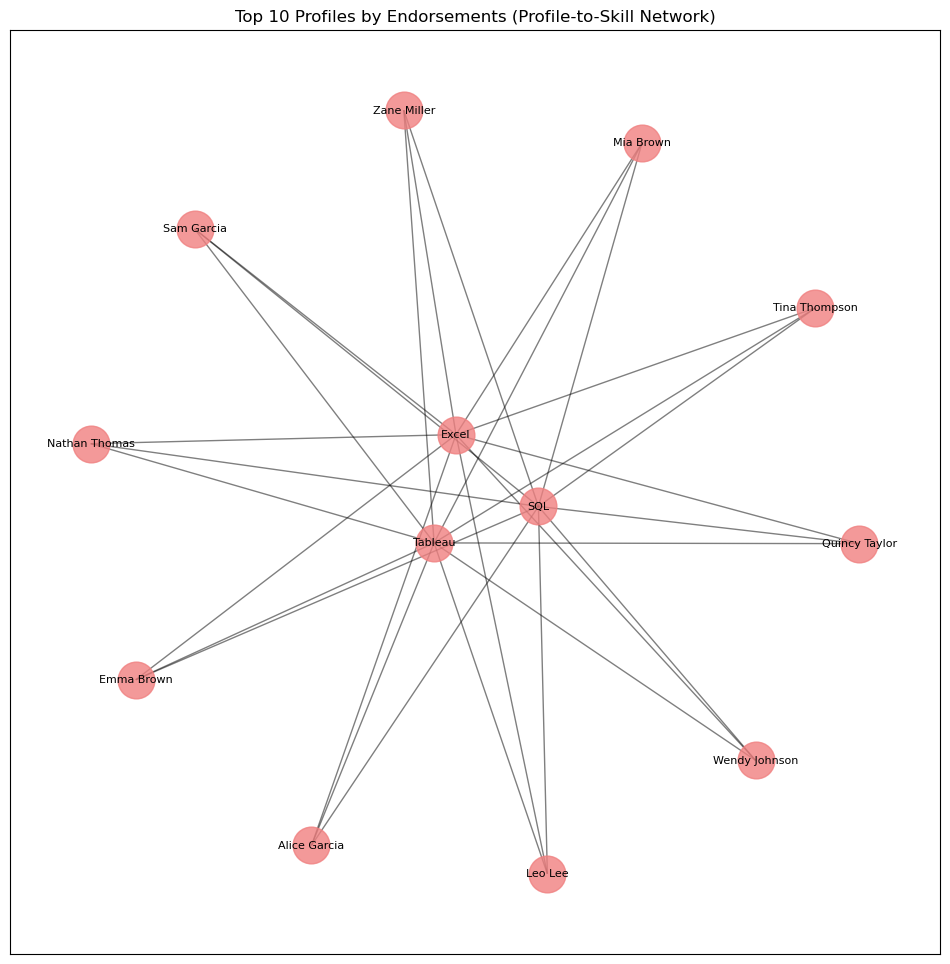

In [11]:
# Filter top 10 profiles by endorsements
top_profiles_df = profiles_df.nlargest(10, 'Endorsements')

# Initialize a new graph for the top profiles
G_top_profiles = nx.Graph()

# Add nodes and edges between the top profiles and their skills
for index, row in top_profiles_df.iterrows():
    skills = row['Skills'].split(', ')
    profile_id = row['Profile ID']
    
    # Add the profile node
    G_top_profiles.add_node(profile_id, label=row['Name'], type='profile')
    
    # Add edges between the profile and each skill
    for skill in skills:
        G_top_profiles.add_node(skill, label=skill, type='skill')
        G_top_profiles.add_edge(profile_id, skill)

# Visualize the top profile network
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G_top_profiles, k=0.5, seed=42)

# Draw nodes and edges
nx.draw_networkx_nodes(G_top_profiles, pos, node_size=700, node_color='lightcoral', alpha=0.8)
nx.draw_networkx_edges(G_top_profiles, pos, alpha=0.5)
nx.draw_networkx_labels(G_top_profiles, pos, labels={n: G_top_profiles.nodes[n]['label'] for n in G_top_profiles.nodes()}, font_size=8)

plt.title('Top 10 Profiles by Endorsements (Profile-to-Skill Network)')
plt.show()


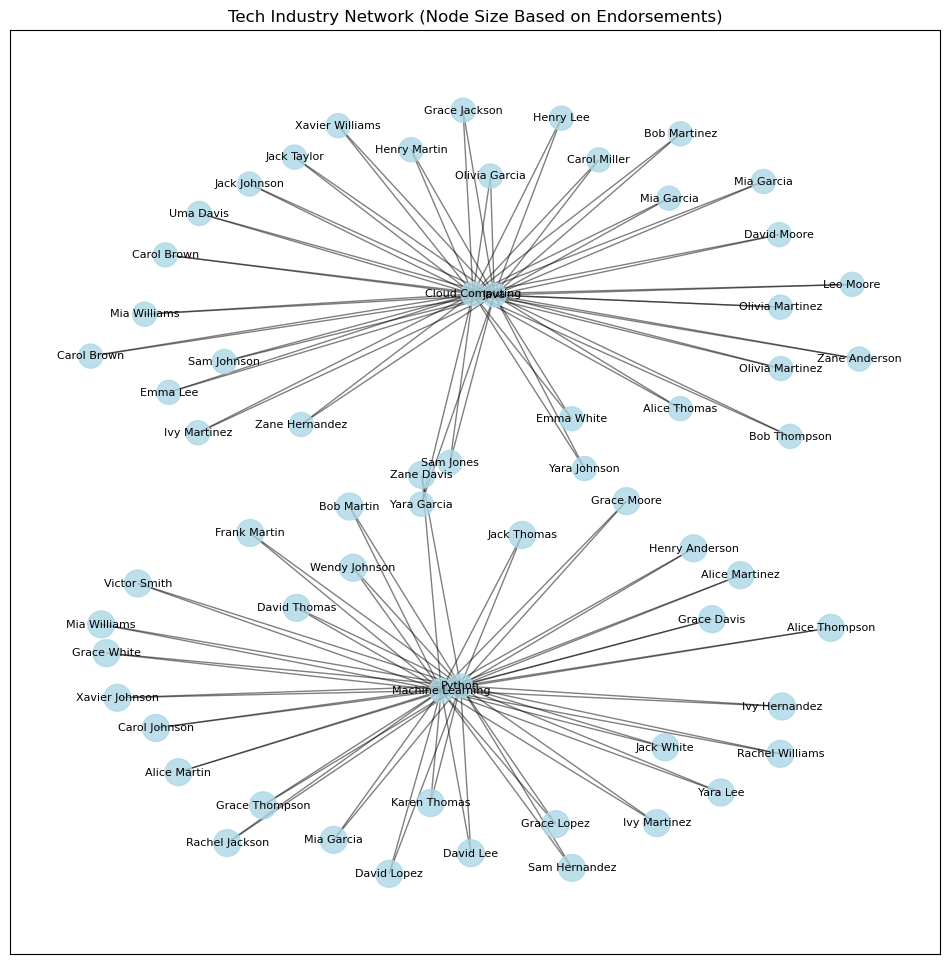

In [12]:
# Scale the size of profile nodes based on endorsements
node_sizes = []
for node in G_tech.nodes():
    if 'profile' in G_tech.nodes[node]['type']:
        profile = tech_profiles_df[tech_profiles_df['Profile ID'] == node]
        node_sizes.append(profile['Endorsements'].values[0] * 5)  # Scale by a factor of 5
    else:
        node_sizes.append(300)  # Skills remain small

# Visualize the network with scaled node sizes
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G_tech, k=0.5, seed=42)

# Draw nodes and edges
nx.draw_networkx_nodes(G_tech, pos, node_size=node_sizes, node_color='lightblue', alpha=0.8)
nx.draw_networkx_edges(G_tech, pos, alpha=0.5)
nx.draw_networkx_labels(G_tech, pos, labels={n: G_tech.nodes[n]['label'] for n in G_tech.nodes()}, font_size=8)

plt.title('Tech Industry Network (Node Size Based on Endorsements)')
plt.show()


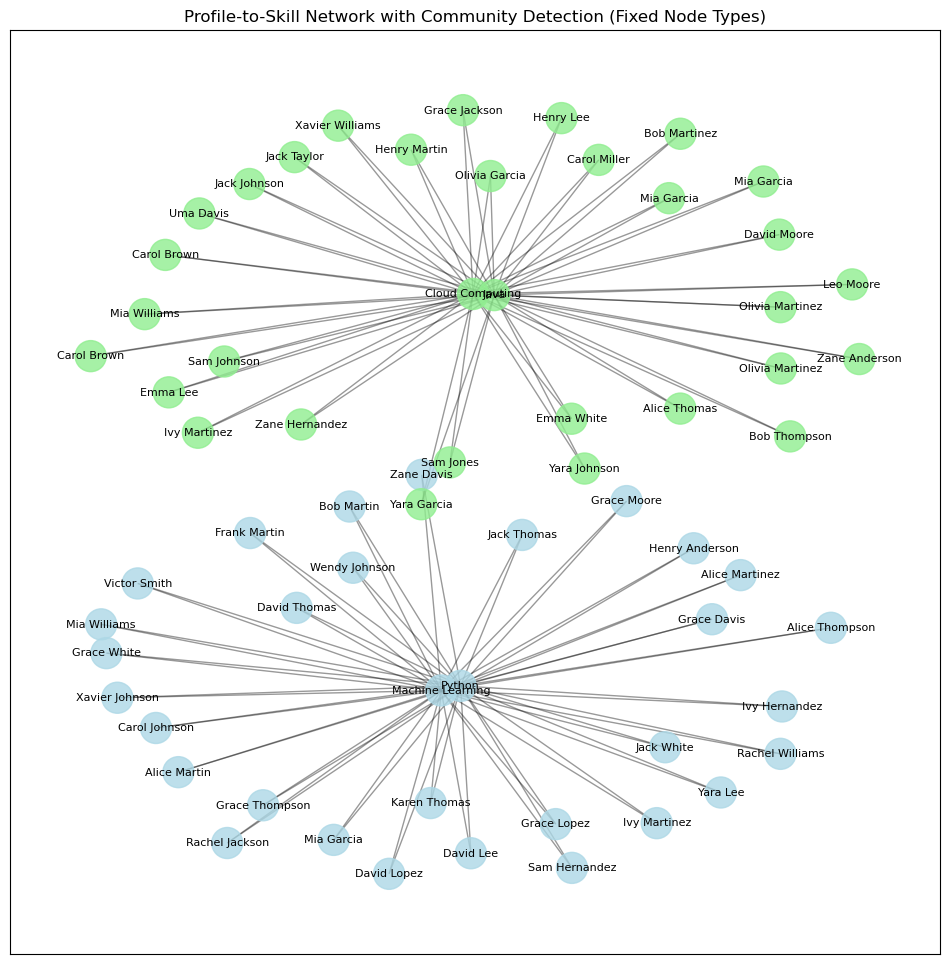

In [13]:
from networkx.algorithms import community

# Convert all nodes (both profiles and skills) to consistent string types or tuples (ID, type)
G_string = nx.Graph()

# Create a mapping for profiles and skills
for index, row in tech_profiles_df.iterrows():
    profile_node = f"profile_{row['Profile ID']}"  # Use string for profile
    G_string.add_node(profile_node, label=row['Name'], type='profile')
    
    skills = row['Skills'].split(', ')
    for skill in skills:
        skill_node = f"skill_{skill}"  # Use string for skills
        G_string.add_node(skill_node, label=skill, type='skill')
        G_string.add_edge(profile_node, skill_node)  # Add edge between profile and skill

# Now perform community detection on G_string with string nodes
communities = community.greedy_modularity_communities(G_string)

# Assign colors to each community
community_colors = ['lightblue', 'lightgreen', 'lightcoral', 'lightyellow', 'lightgray']
community_mapping = {}

# Assign a color to each node based on the community it belongs to
for idx, comm in enumerate(communities):
    for node in comm:
        community_mapping[node] = community_colors[idx % len(community_colors)]

# Draw the community-based network with correct node labels
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G_string, k=0.5, seed=42)

# Draw nodes and edges with color-coded communities
node_colors_community = [community_mapping[node] for node in G_string.nodes()]
nx.draw_networkx_nodes(G_string, pos, node_size=500, node_color=node_colors_community, alpha=0.8)
nx.draw_networkx_edges(G_string, pos, alpha=0.4)
nx.draw_networkx_labels(G_string, pos, labels={n: G_string.nodes[n]['label'] for n in G_string.nodes()}, font_size=8)

plt.title('Profile-to-Skill Network with Community Detection (Fixed Node Types)')
plt.show()


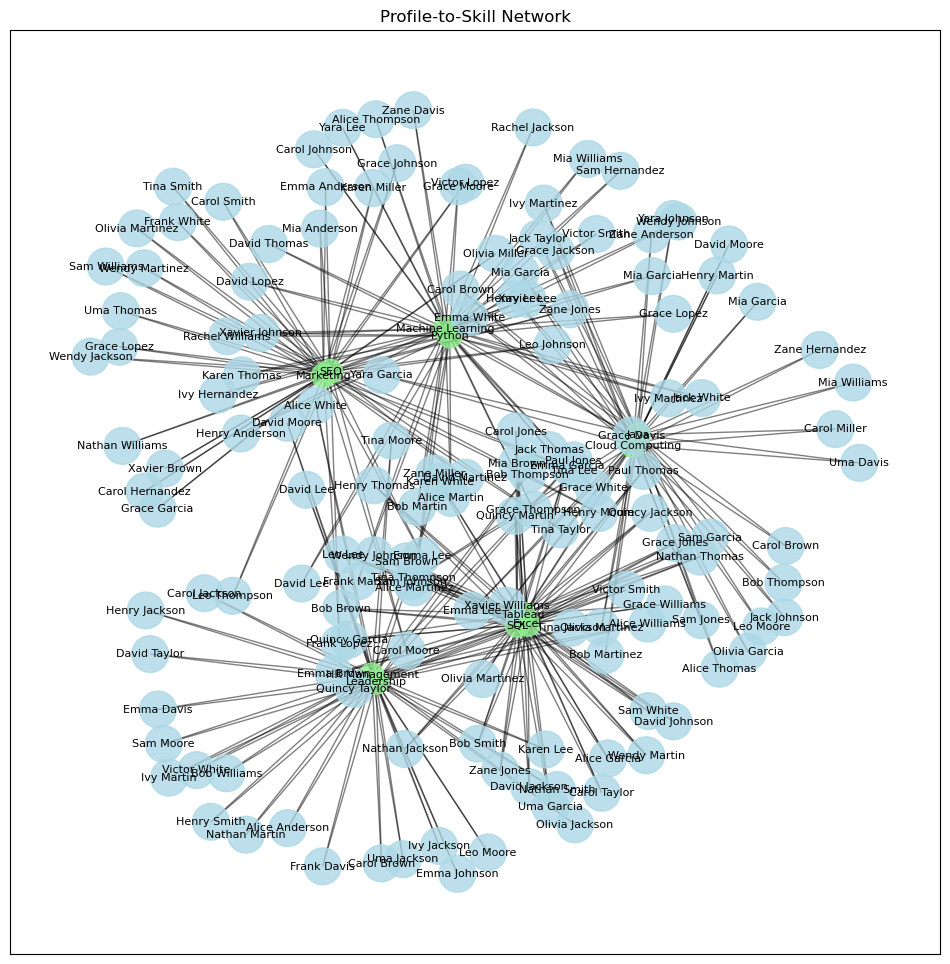

In [14]:

# Load the datasets
profiles_df = pd.read_csv("C://Users//Bhargavi//Downloads//linkedin_profiles.csv")

# Initialize a new graph for the Profile-to-Skill network
G_skills = nx.Graph()

# Add nodes and edges between profiles and their skills
for index, row in profiles_df.iterrows():
    skills = row['Skills'].split(', ')  # Split skills by comma
    profile_id = row['Profile ID']
    
    # Add the profile node
    G_skills.add_node(profile_id, label=row['Name'], type='profile')
    
    # Add edges between the profile and each skill
    for skill in skills:
        G_skills.add_node(skill, label=skill, type='skill')  # Add skill as a node
        G_skills.add_edge(profile_id, skill)  # Connect profile to the skill

# Visualize the Profile-to-Skill Network
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G_skills, k=0.5, seed=42)

# Draw nodes and edges
node_sizes = [700 if G_skills.nodes[node]['type'] == 'profile' else 300 for node in G_skills.nodes()]
node_colors = ['lightblue' if G_skills.nodes[node]['type'] == 'profile' else 'lightgreen' for node in G_skills.nodes()]

nx.draw_networkx_nodes(G_skills, pos, node_size=node_sizes, node_color=node_colors, alpha=0.8)
nx.draw_networkx_edges(G_skills, pos, alpha=0.5)
nx.draw_networkx_labels(G_skills, pos, labels={n: G_skills.nodes[n]['label'] for n in G_skills.nodes()}, font_size=8)

plt.title('Profile-to-Skill Network')
plt.show()




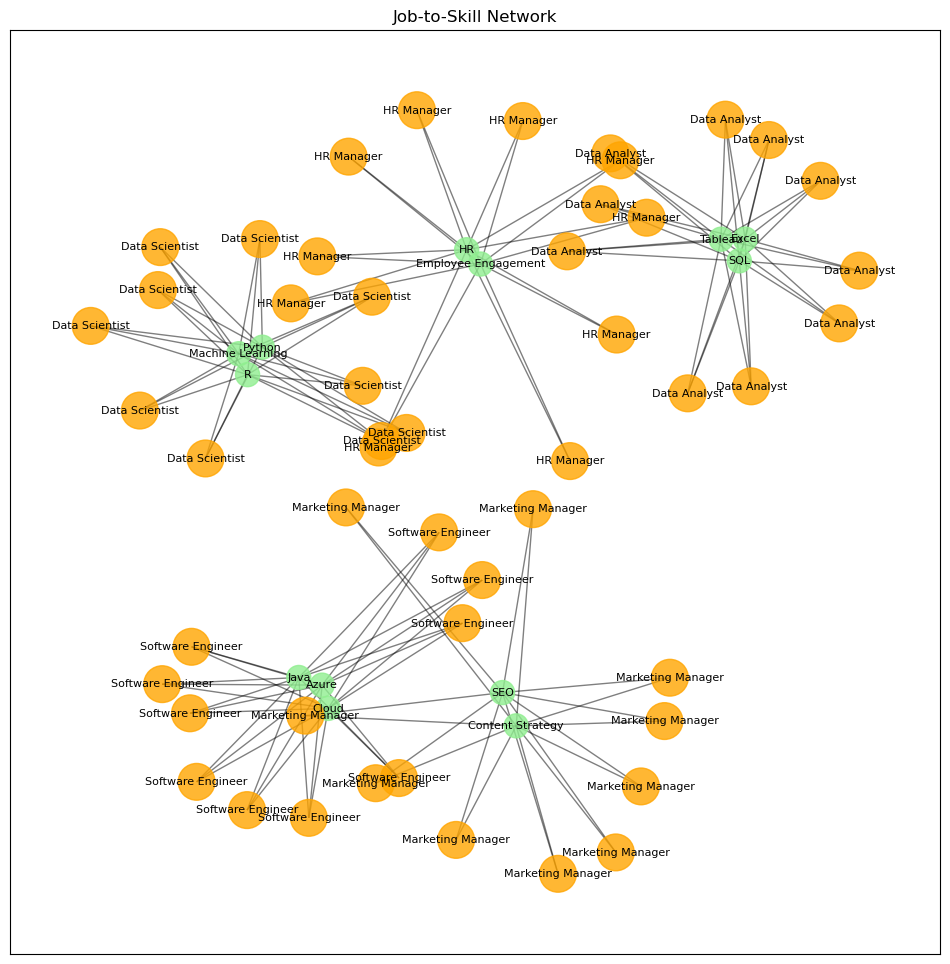

In [15]:
# Load the job postings dataset
jobs_df = pd.read_csv("C://Users//Bhargavi//Downloads//linkedin_job_postings.csv")

# Initialize a new graph for the Job-to-Skill network
G_jobs = nx.Graph()

# Add nodes and edges between job postings and required skills
for index, row in jobs_df.iterrows():
    skills = row['Required Skills'].split(', ')  # Split required skills by comma
    job_id = row['Job ID']
    
    # Add the job posting node
    G_jobs.add_node(job_id, label=row['Job Title'], type='job')
    
    # Add edges between the job posting and each required skill
    for skill in skills:
        G_jobs.add_node(skill, label=skill, type='skill')  # Add skill as a node
        G_jobs.add_edge(job_id, skill)  # Connect job posting to the skill

# Visualize the Job-to-Skill Network
plt.figure(figsize=(12, 12))
pos_jobs = nx.spring_layout(G_jobs, k=0.5, seed=42)

# Draw nodes and edges
node_sizes_jobs = [700 if G_jobs.nodes[node]['type'] == 'job' else 300 for node in G_jobs.nodes()]
node_colors_jobs = ['orange' if G_jobs.nodes[node]['type'] == 'job' else 'lightgreen' for node in G_jobs.nodes()]

nx.draw_networkx_nodes(G_jobs, pos_jobs, node_size=node_sizes_jobs, node_color=node_colors_jobs, alpha=0.8)
nx.draw_networkx_edges(G_jobs, pos_jobs, alpha=0.5)
nx.draw_networkx_labels(G_jobs, pos_jobs, labels={n: G_jobs.nodes[n]['label'] for n in G_jobs.nodes()}, font_size=8)

plt.title('Job-to-Skill Network')
plt.show()


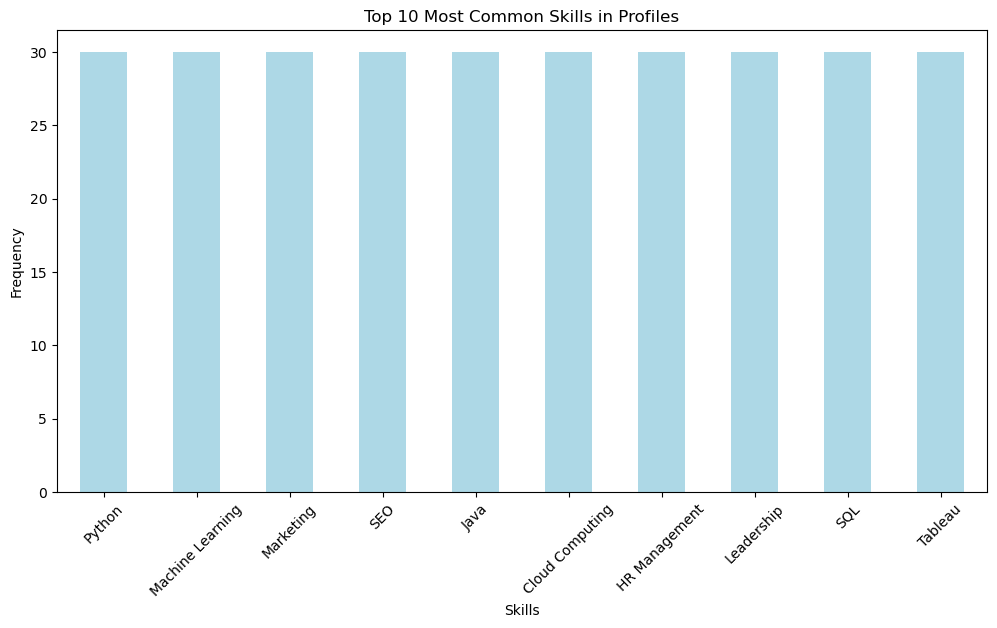

In [16]:
# Count the frequency of each skill across all profiles
skills_series = profiles_df['Skills'].str.cat(sep=', ').split(', ')
skills_frequency = pd.Series(skills_series).value_counts()

# Plot the top 10 most common skills
plt.figure(figsize=(12, 6))
skills_frequency.head(10).plot(kind='bar', color='lightblue')
plt.title('Top 10 Most Common Skills in Profiles')
plt.xlabel('Skills')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()


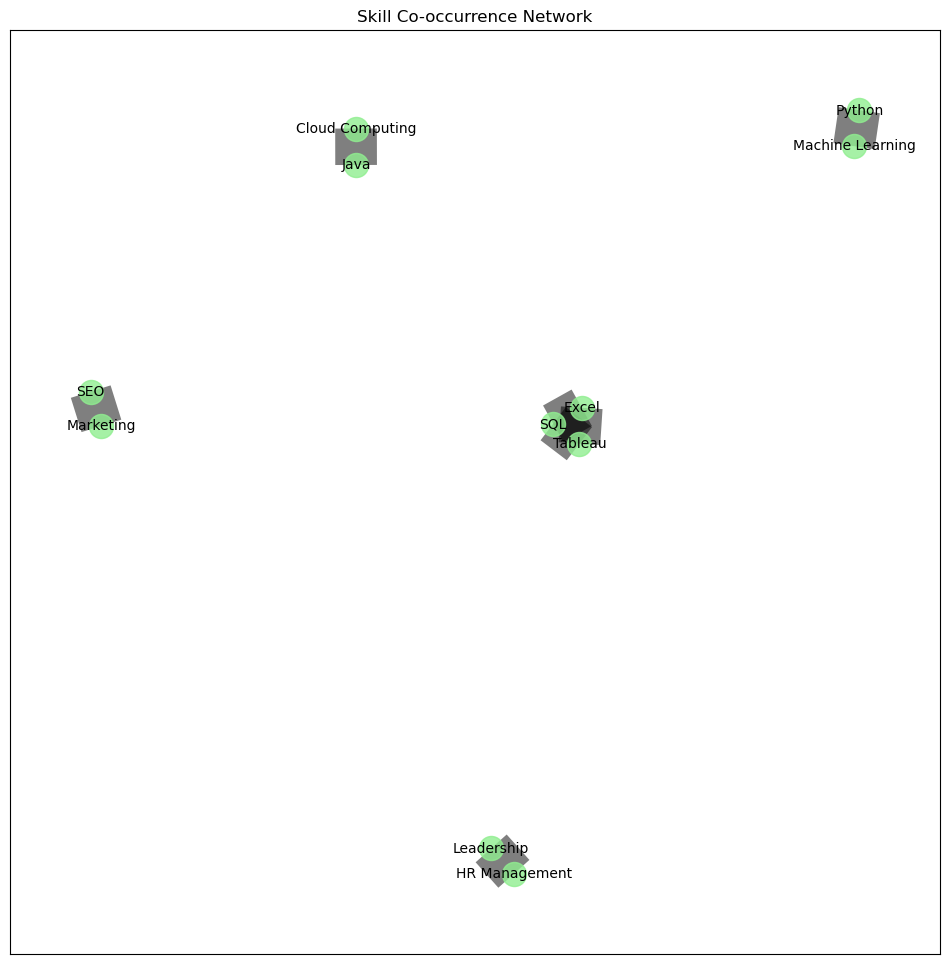

In [17]:
# Initialize a new graph for the Skill Co-occurrence network
G_skills_cooccurrence = nx.Graph()

# Create a dictionary to count co-occurrences
skill_pairs = {}

# Iterate through profiles to create pairs of skills
for index, row in profiles_df.iterrows():
    skills = row['Skills'].split(', ')
    
    # Generate all combinations of skills for the current profile
    for i in range(len(skills)):
        for j in range(i + 1, len(skills)):
            skill_pair = (skills[i].strip(), skills[j].strip())
            if skill_pair in skill_pairs:
                skill_pairs[skill_pair] += 1
            else:
                skill_pairs[skill_pair] = 1

# Add edges to the graph based on co-occurrences
for pair, count in skill_pairs.items():
    G_skills_cooccurrence.add_edge(pair[0], pair[1], weight=count)

# Visualize the Skill Co-occurrence Network
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G_skills_cooccurrence, k=0.3, seed=42)

# Draw nodes and edges
edge_weights = [G_skills_cooccurrence[u][v]['weight'] for u, v in G_skills_cooccurrence.edges()]
nx.draw_networkx_nodes(G_skills_cooccurrence, pos, node_size=300, node_color='lightgreen', alpha=0.8)
nx.draw_networkx_edges(G_skills_cooccurrence, pos, width=edge_weights, alpha=0.5)
nx.draw_networkx_labels(G_skills_cooccurrence, pos, font_size=10)

plt.title('Skill Co-occurrence Network')
plt.show()


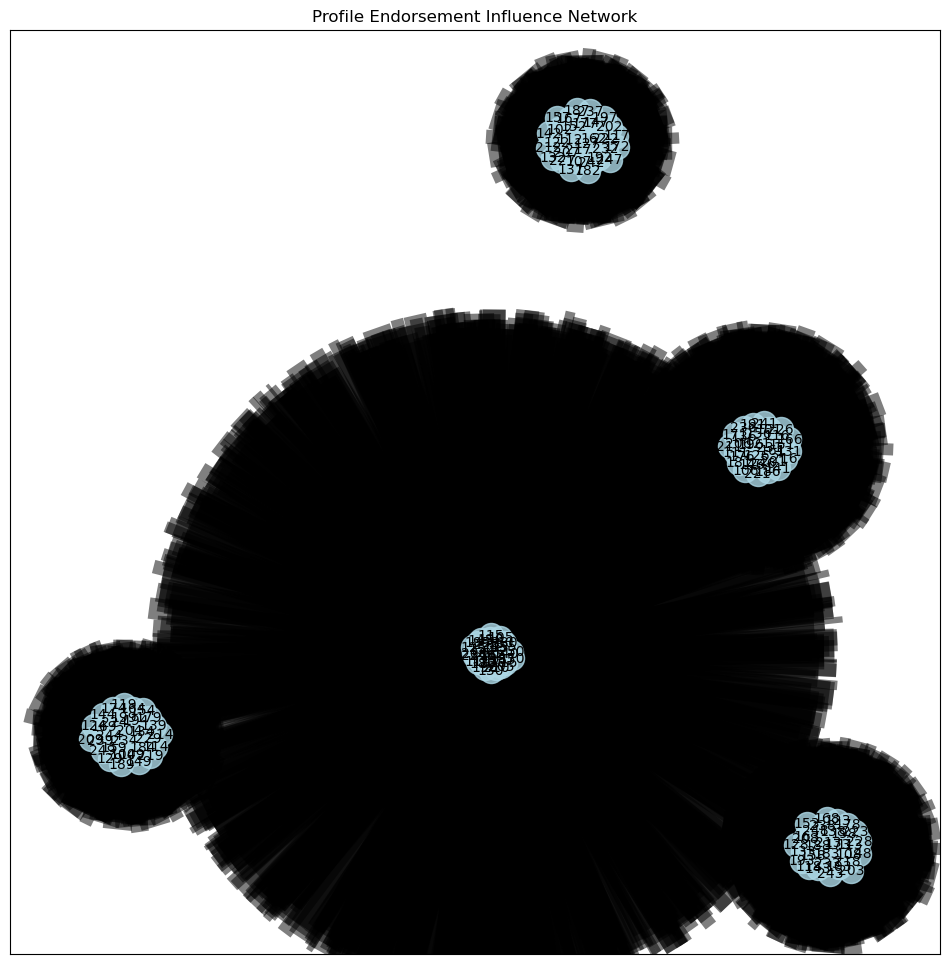

In [18]:
# Initialize a new graph for the Profile Endorsement Influence network
G_endorsements = nx.Graph()

# Add profiles as nodes
for index, row in profiles_df.iterrows():
    profile_id = row['Profile ID']
    G_endorsements.add_node(profile_id, label=row['Name'])

# Create connections based on endorsements for shared skills
for index, row in profiles_df.iterrows():
    skills = row['Skills'].split(', ')
    endorsements = row['Endorsements']
    
    # Connect profiles that share skills with weighted edges
    for i in range(len(skills)):
        for j in range(i + 1, len(skills)):
            profile1 = row['Profile ID']
            skill1 = skills[i].strip()
            skill2 = skills[j].strip()
            
            # Find other profiles with the same skills
            for idx, other_row in profiles_df.iterrows():
                if other_row['Profile ID'] != profile1:
                    if skill1 in other_row['Skills'] and skill2 in other_row['Skills']:
                        profile2 = other_row['Profile ID']
                        if G_endorsements.has_edge(profile1, profile2):
                            G_endorsements[profile1][profile2]['weight'] += endorsements
                        else:
                            G_endorsements.add_edge(profile1, profile2, weight=endorsements)

# Visualize the Profile Endorsement Influence Network
plt.figure(figsize=(12, 12))
pos_endorsements = nx.spring_layout(G_endorsements, k=0.3, seed=42)

# Draw nodes and edges
edge_weights = [G_endorsements[u][v]['weight'] for u, v in G_endorsements.edges()]
nx.draw_networkx_nodes(G_endorsements, pos_endorsements, node_size=300, node_color='lightblue', alpha=0.8)
nx.draw_networkx_edges(G_endorsements, pos_endorsements, width=edge_weights, alpha=0.5)
nx.draw_networkx_labels(G_endorsements, pos_endorsements, font_size=10)

plt.title('Profile Endorsement Influence Network')
plt.show()


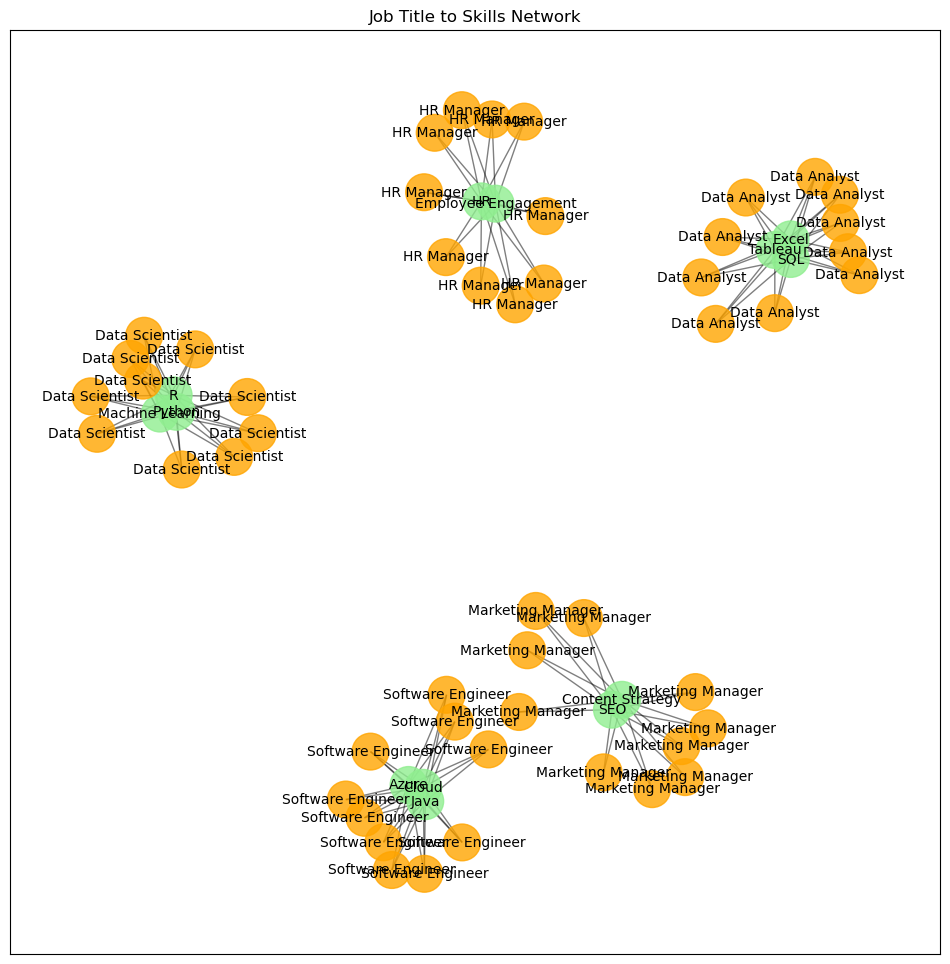

In [19]:
# Initialize a new bipartite graph for Job Title to Skills network
G_job_skills = nx.Graph()

# Add job titles and required skills to the graph
for index, row in jobs_df.iterrows():
    job_id = row['Job ID']
    job_title = row['Job Title']
    
    # Add the job title node
    G_job_skills.add_node(job_id, label=job_title, type='job')

    # Add edges to required skills
    required_skills = row['Required Skills'].split(', ')
    for skill in required_skills:
        G_job_skills.add_node(skill, label=skill, type='skill')  # Add skill as a node
        G_job_skills.add_edge(job_id, skill)  # Connect job title to skill

# Visualize the Job Title to Skills Network
plt.figure(figsize=(12, 12))
pos_job_skills = nx.spring_layout(G_job_skills, k=0.3, seed=42)

# Draw nodes and edges
node_colors_job_skills = ['orange' if G_job_skills.nodes[node]['type'] == 'job' else 'lightgreen' for node in G_job_skills.nodes()]
nx.draw_networkx_nodes(G_job_skills, pos_job_skills, node_size=700, node_color=node_colors_job_skills, alpha=0.8)
nx.draw_networkx_edges(G_job_skills, pos_job_skills, alpha=0.5)
nx.draw_networkx_labels(G_job_skills, pos_job_skills, labels={n: G_job_skills.nodes[n]['label'] for n in G_job_skills.nodes()}, font_size=10)

plt.title('Job Title to Skills Network')
plt.show()


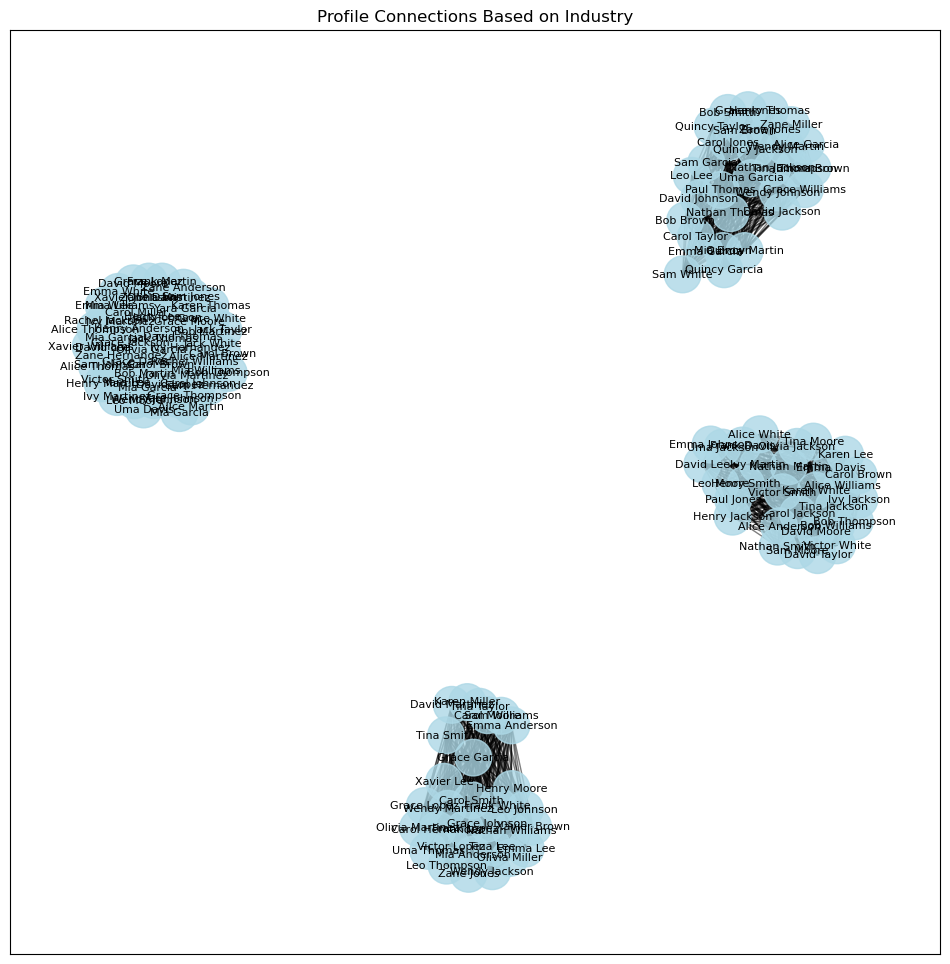

In [20]:
# Initialize a new graph for the Industry-based Profile network
G_industry = nx.Graph()

# Add profiles to the graph based on their industries
for index, row in profiles_df.iterrows():
    profile_id = row['Profile ID']
    industry = row['Industry']
    
    # Add the profile node
    G_industry.add_node(profile_id, label=row['Name'], type='profile', industry=industry)

    # Connect profiles in the same industry
    for other_index, other_row in profiles_df.iterrows():
        if index != other_index and row['Industry'] == other_row['Industry']:
            G_industry.add_edge(profile_id, other_row['Profile ID'])

# Visualize the Industry-Based Profile Network
plt.figure(figsize=(12, 12))
pos_industry = nx.spring_layout(G_industry, k=0.5, seed=42)

# Draw nodes and edges
node_colors_industry = ['lightblue' if G_industry.nodes[node]['type'] == 'profile' else 'gray' for node in G_industry.nodes()]
nx.draw_networkx_nodes(G_industry, pos_industry, node_size=700, node_color=node_colors_industry, alpha=0.8)
nx.draw_networkx_edges(G_industry, pos_industry, alpha=0.5)
nx.draw_networkx_labels(G_industry, pos_industry, labels={n: G_industry.nodes[n]['label'] for n in G_industry.nodes()}, font_size=8)

plt.title('Profile Connections Based on Industry')
plt.show()


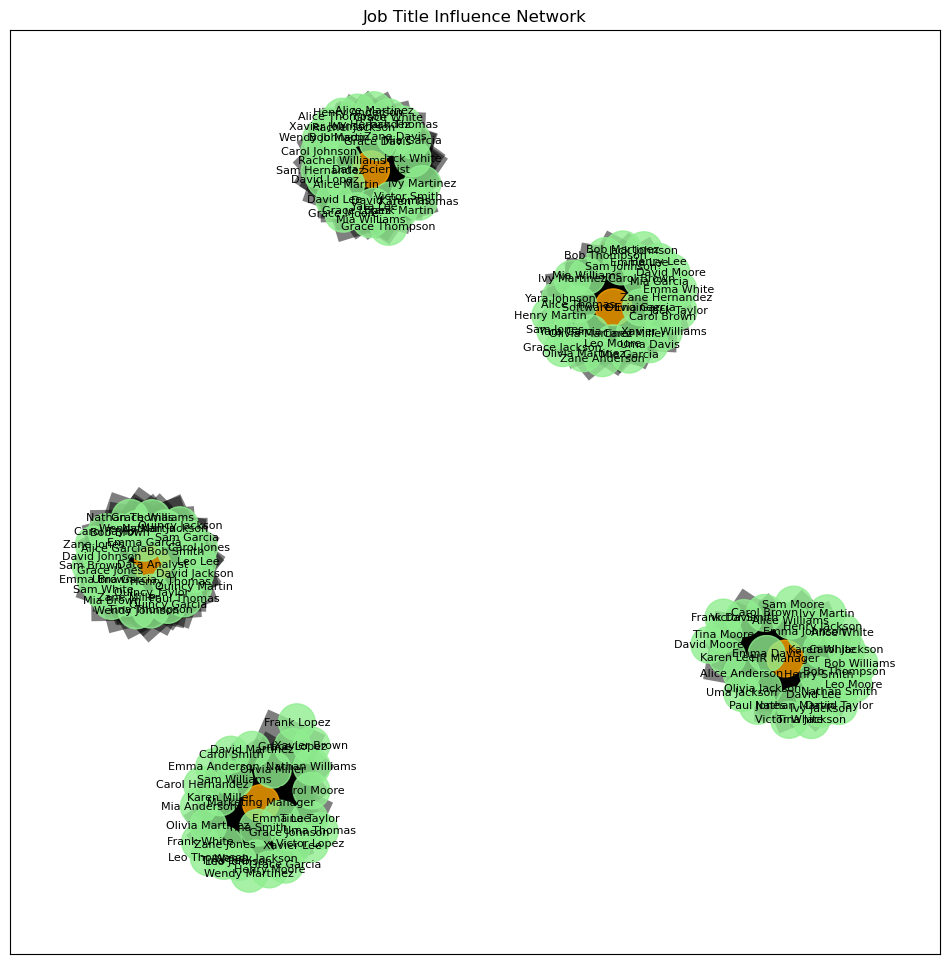

In [22]:
# Initialize a new graph for the Job Title Influence network
G_job_influence = nx.Graph()

# Add job titles and connect them to profiles based on endorsements
for index, row in profiles_df.iterrows():
    profile_id = row['Profile ID']
    job_title = row['Job Title']
    endorsements = row['Endorsements']
    
    # Add the job title node
    if not G_job_influence.has_node(job_title):
        G_job_influence.add_node(job_title, type='job', label=job_title)
    
    # Add the profile node
    G_job_influence.add_node(profile_id, label=row['Name'], type='profile')
    
    # Connect profiles to their job titles, weighted by endorsements
    G_job_influence.add_edge(job_title, profile_id, weight=endorsements)

# Visualize the Job Title Influence Network
plt.figure(figsize=(12, 12))
pos_job_influence = nx.spring_layout(G_job_influence, k=0.5, seed=42)

# Draw nodes and edges
node_colors_job_influence = ['orange' if G_job_influence.nodes[node]['type'] == 'job' else 'lightgreen' for node in G_job_influence.nodes()]
edge_weights = [G_job_influence[u][v]['weight'] for u, v in G_job_influence.edges()]
nx.draw_networkx_nodes(G_job_influence, pos_job_influence, node_size=700, node_color=node_colors_job_influence, alpha=0.8)
nx.draw_networkx_edges(G_job_influence, pos_job_influence, width=edge_weights, alpha=0.5)
nx.draw_networkx_labels(G_job_influence, pos_job_influence, labels={n: G_job_influence.nodes[n]['label'] for n in G_job_influence.nodes()}, font_size=8)

plt.title('Job Title Influence Network')
plt.show()


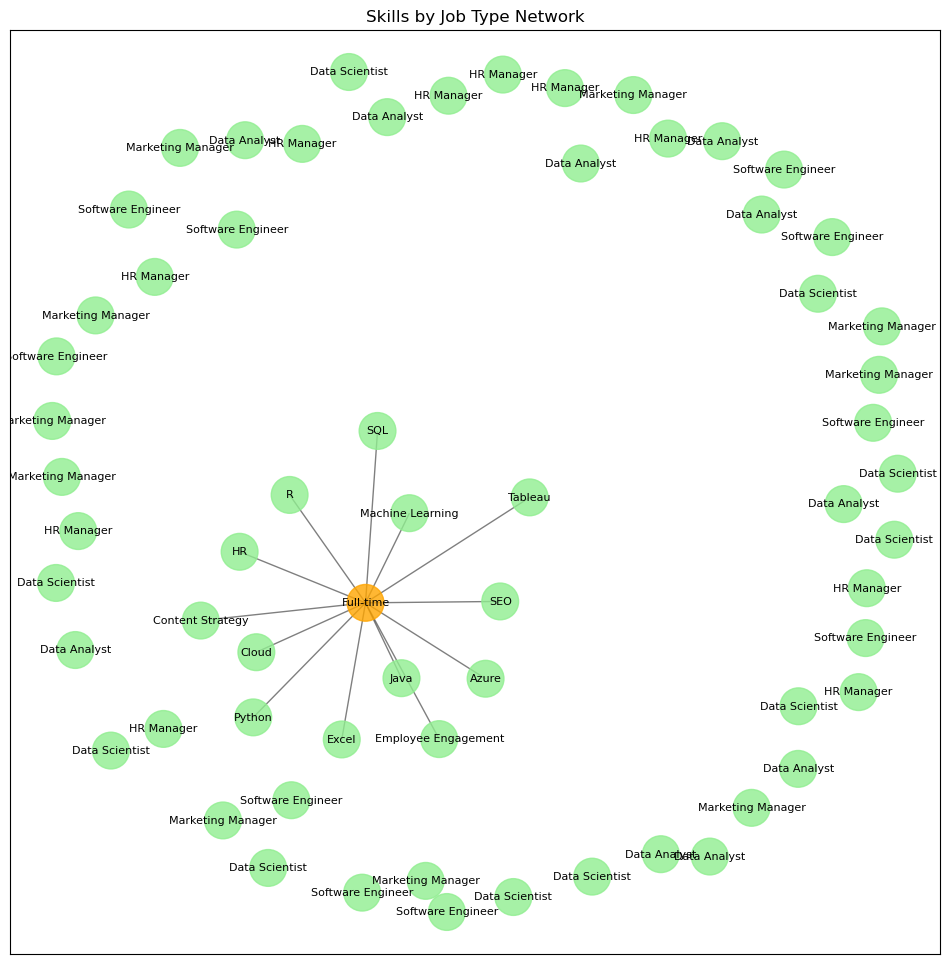

In [23]:
# Initialize a new bipartite graph for Skills by Job Type network
G_skills_job_type = nx.Graph()

# Add job types and connect them to required skills
for index, row in jobs_df.iterrows():
    job_type = row['Job Type']
    job_id = row['Job ID']
    
    # Add the job type node
    if not G_skills_job_type.has_node(job_type):
        G_skills_job_type.add_node(job_type, type='job_type', label=job_type)
    
    # Add the job posting node
    G_skills_job_type.add_node(job_id, label=row['Job Title'], type='job')
    
    # Add edges to required skills
    required_skills = row['Required Skills'].split(', ')
    for skill in required_skills:
        G_skills_job_type.add_node(skill, label=skill, type='skill')  # Add skill as a node
        G_skills_job_type.add_edge(job_type, skill)  # Connect job type to skill

# Visualize the Skills by Job Type Network
plt.figure(figsize=(12, 12))
pos_skills_job_type = nx.spring_layout(G_skills_job_type, k=0.5, seed=42)

# Draw nodes and edges
node_colors_skills_job_type = ['orange' if G_skills_job_type.nodes[node]['type'] == 'job_type' else 'lightgreen' for node in G_skills_job_type.nodes()]
nx.draw_networkx_nodes(G_skills_job_type, pos_skills_job_type, node_size=700, node_color=node_colors_skills_job_type, alpha=0.8)
nx.draw_networkx_edges(G_skills_job_type, pos_skills_job_type, alpha=0.5)
nx.draw_networkx_labels(G_skills_job_type, pos_skills_job_type, labels={n: G_skills_job_type.nodes[n]['label'] for n in G_skills_job_type.nodes()}, font_size=8)

plt.title('Skills by Job Type Network')
plt.show()


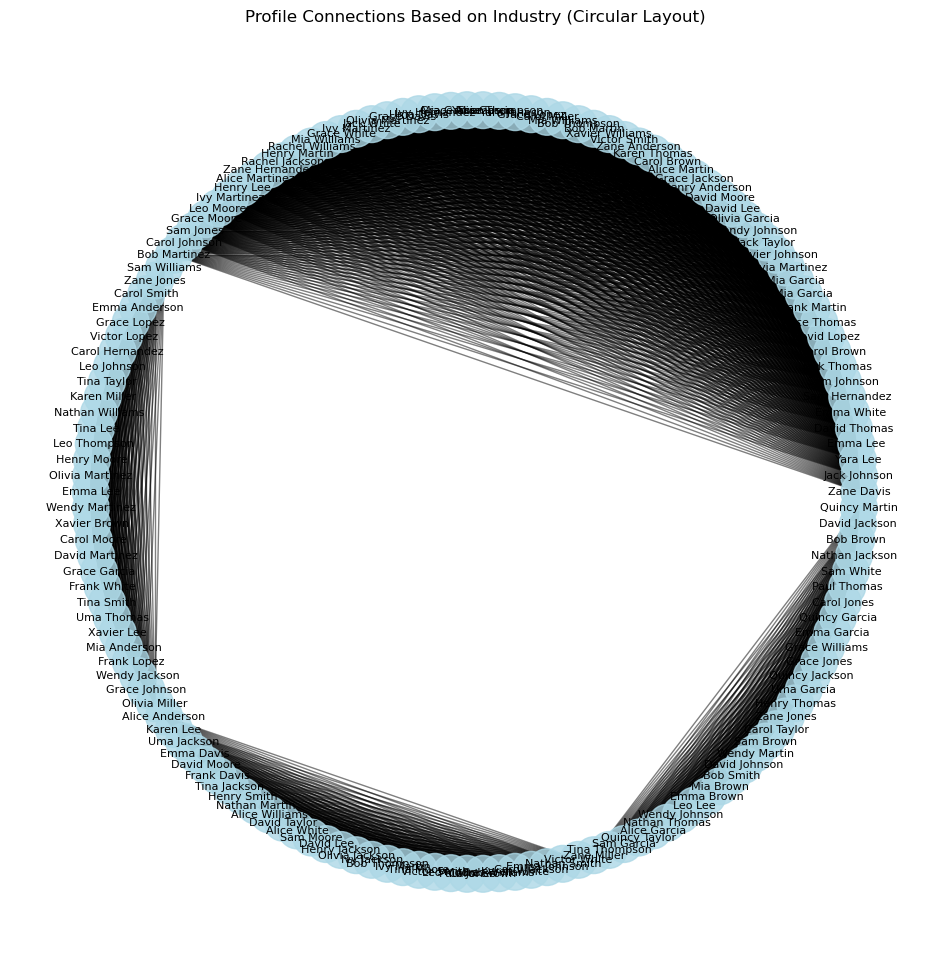

In [24]:
# Initialize a new graph for the Industry-based Profile network
G_industry = nx.Graph()

# Add profiles to the graph based on their industries
for index, row in profiles_df.iterrows():
    profile_id = row['Profile ID']
    industry = row['Industry']
    
    # Add the profile node
    G_industry.add_node(profile_id, label=row['Name'], type='profile', industry=industry)

    # Connect profiles in the same industry
    for other_index, other_row in profiles_df.iterrows():
        if index != other_index and row['Industry'] == other_row['Industry']:
            G_industry.add_edge(profile_id, other_row['Profile ID'])

# Visualize the Industry-Based Profile Network
plt.figure(figsize=(12, 12))
pos_industry = nx.circular_layout(G_industry)  # Try circular layout

# Draw nodes and edges
node_colors_industry = ['lightblue' if G_industry.nodes[node]['type'] == 'profile' else 'gray' for node in G_industry.nodes()]
nx.draw_networkx_nodes(G_industry, pos_industry, node_size=700, node_color=node_colors_industry, alpha=0.8)
nx.draw_networkx_edges(G_industry, pos_industry, alpha=0.5)
nx.draw_networkx_labels(G_industry, pos_industry, labels={n: G_industry.nodes[n]['label'] for n in G_industry.nodes()}, font_size=8)

plt.title('Profile Connections Based on Industry (Circular Layout)')
plt.axis('off')  # Turn off the axis
plt.show()


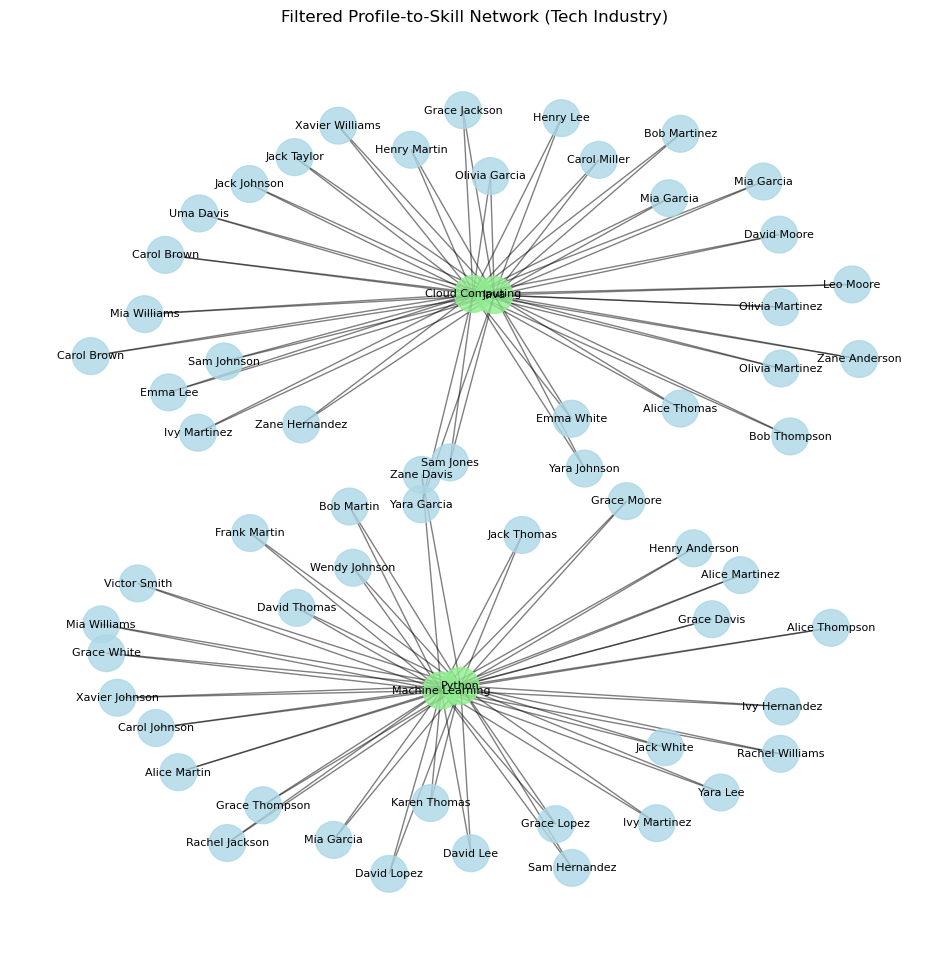

In [46]:
# Filter profiles by industry (e.g., Tech industry)
tech_profiles_df = profiles_df[profiles_df['Industry'] == 'Tech']

# Initialize a new graph for the filtered Profile-to-Skill network
G_tech = nx.Graph()

# Add nodes and edges between profiles and their skills
for index, row in tech_profiles_df.iterrows():
    skills = row['Skills'].split(', ')  # Split skills by comma
    profile_id = row['Profile ID']
    
    # Add the profile node
    G_tech.add_node(profile_id, label=row['Name'], type='profile')
    
    # Add edges between the profile and each skill
    for skill in skills:
        G_tech.add_node(skill, label=skill, type='skill')  # Add skill as a node
        G_tech.add_edge(profile_id, skill)  # Connect profile to the skill

# Visualize the filtered network
plt.figure(figsize=(12, 12))
pos_tech = nx.spring_layout(G_tech, k=0.5, seed=42)  # Spring layout for spacing

# Draw nodes and edges
node_colors_tech = ['lightblue' if G_tech.nodes[node]['type'] == 'profile' else 'lightgreen' for node in G_tech.nodes()]
nx.draw_networkx_nodes(G_tech, pos_tech, node_size=700, node_color=node_colors_tech, alpha=0.8)
nx.draw_networkx_edges(G_tech, pos_tech, alpha=0.5)
nx.draw_networkx_labels(G_tech, pos_tech, labels={n: G_tech.nodes[n]['label'] for n in G_tech.nodes()}, font_size=8)

plt.title('Filtered Profile-to-Skill Network (Tech Industry)')
plt.axis('off')  # Turn off the axis
plt.show()


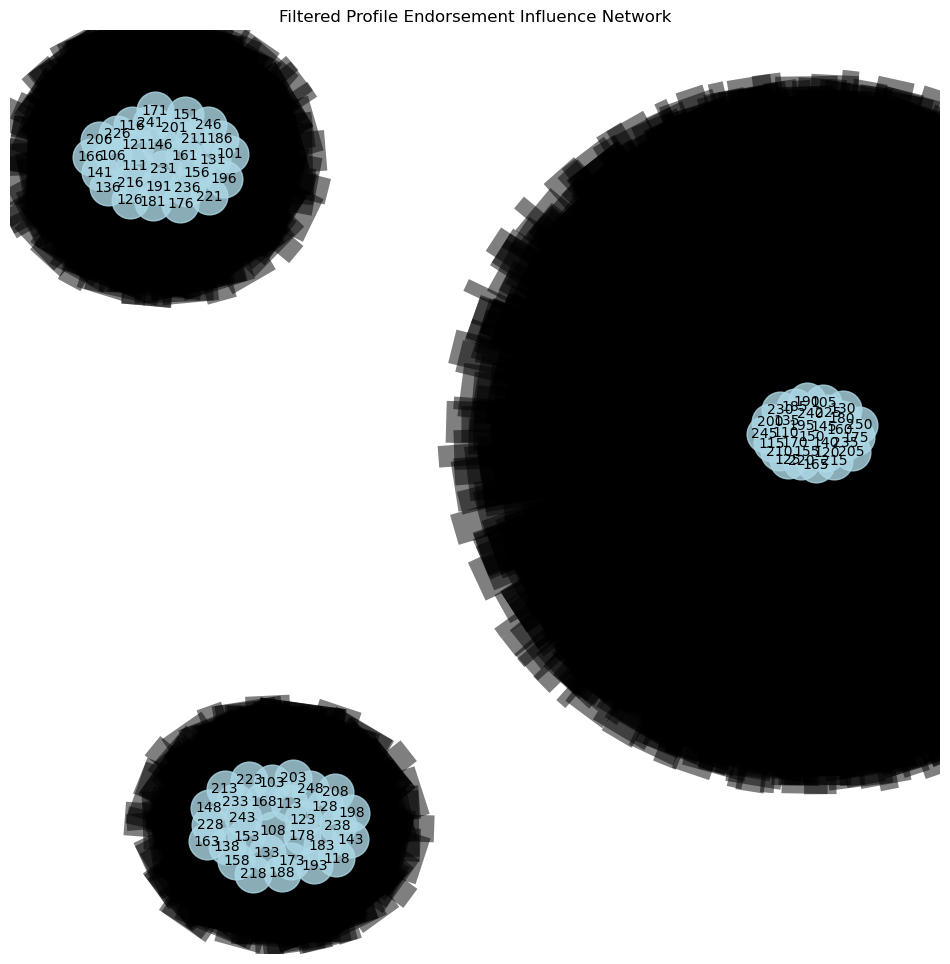

In [48]:
# Initialize a new graph for the Profile Endorsement Influence network
G_endorsements = nx.Graph()

# Add profiles as nodes
for index, row in profiles_df.iterrows():
    profile_id = row['Profile ID']
    endorsements = row['Endorsements']
    
    # Only consider profiles with more than 50 endorsements
    if endorsements > 50:
        G_endorsements.add_node(profile_id, label=row['Name'])

# Create connections based on endorsements for shared skills
for index, row in profiles_df.iterrows():
    skills = row['Skills'].split(', ')
    endorsements = row['Endorsements']
    
    if endorsements > 50:  # Filter for influential profiles
        for i in range(len(skills)):
            for j in range(i + 1, len(skills)):
                profile1 = row['Profile ID']
                skill1 = skills[i].strip()
                skill2 = skills[j].strip()
                
                for idx, other_row in profiles_df.iterrows():
                    if other_row['Profile ID'] != profile1 and other_row['Endorsements'] > 50:
                        if skill1 in other_row['Skills'] and skill2 in other_row['Skills']:
                            profile2 = other_row['Profile ID']
                            if G_endorsements.has_edge(profile1, profile2):
                                G_endorsements[profile1][profile2]['weight'] += endorsements
                            else:
                                G_endorsements.add_edge(profile1, profile2, weight=endorsements)

# Visualize the Profile Endorsement Influence Network
plt.figure(figsize=(12, 12))
pos_endorsements = nx.spring_layout(G_endorsements, k=0.5, seed=42)

# Draw nodes and edges with edge thickness based on endorsement counts
edge_weights = [G_endorsements[u][v]['weight'] for u, v in G_endorsements.edges()]
nx.draw_networkx_nodes(G_endorsements, pos_endorsements, node_size=700, node_color='lightblue', alpha=0.8)
nx.draw_networkx_edges(G_endorsements, pos_endorsements, width=edge_weights, alpha=0.5)
nx.draw_networkx_labels(G_endorsements, pos_endorsements, font_size=10)

plt.title('Filtered Profile Endorsement Influence Network')
plt.axis('off')  # Turn off the axis
plt.show()


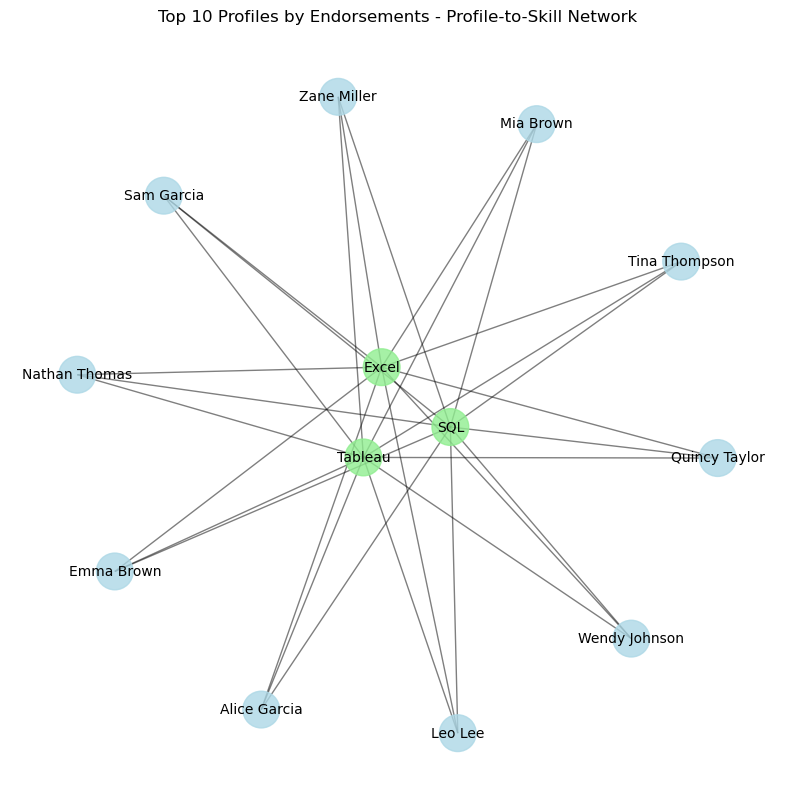

In [52]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# Load the profiles dataset
profiles_df = pd.read_csv("C://Users//Bhargavi//Downloads//linkedin_profiles.csv")

# Filter the top 10 profiles by endorsements
top_profiles_df = profiles_df.nlargest(10, 'Endorsements')

# Initialize a new graph for the Profile-to-Skill network
G_top_skills = nx.Graph()

# Add nodes and edges for the top profiles and their skills
for index, row in top_profiles_df.iterrows():
    profile_id = row['Profile ID']
    skills = row['Skills'].split(', ')
    
    # Add the profile node
    G_top_skills.add_node(profile_id, label=row['Name'], type='profile')
    
    # Add edges between the profile and each skill
    for skill in skills:
        G_top_skills.add_node(skill.strip(), label=skill.strip(), type='skill')  # Add skill as a node
        G_top_skills.add_edge(profile_id, skill.strip())  # Connect profile to the skill

# Visualize the Profile-to-Skill Network
plt.figure(figsize=(10, 10))
pos = nx.spring_layout(G_top_skills, k=0.5, seed=42)  # Adjust layout spacing

# Draw nodes and edges
node_colors = ['lightblue' if G_top_skills.nodes[node]['type'] == 'profile' else 'lightgreen' for node in G_top_skills.nodes()]
nx.draw_networkx_nodes(G_top_skills, pos, node_size=700, node_color=node_colors, alpha=0.8)
nx.draw_networkx_edges(G_top_skills, pos, alpha=0.5)
nx.draw_networkx_labels(G_top_skills, pos, labels={n: G_top_skills.nodes[n]['label'] for n in G_top_skills.nodes()}, font_size=10)

plt.title('Top 10 Profiles by Endorsements - Profile-to-Skill Network')
plt.axis('off')  # Turn off the axis for better visualization
plt.show()


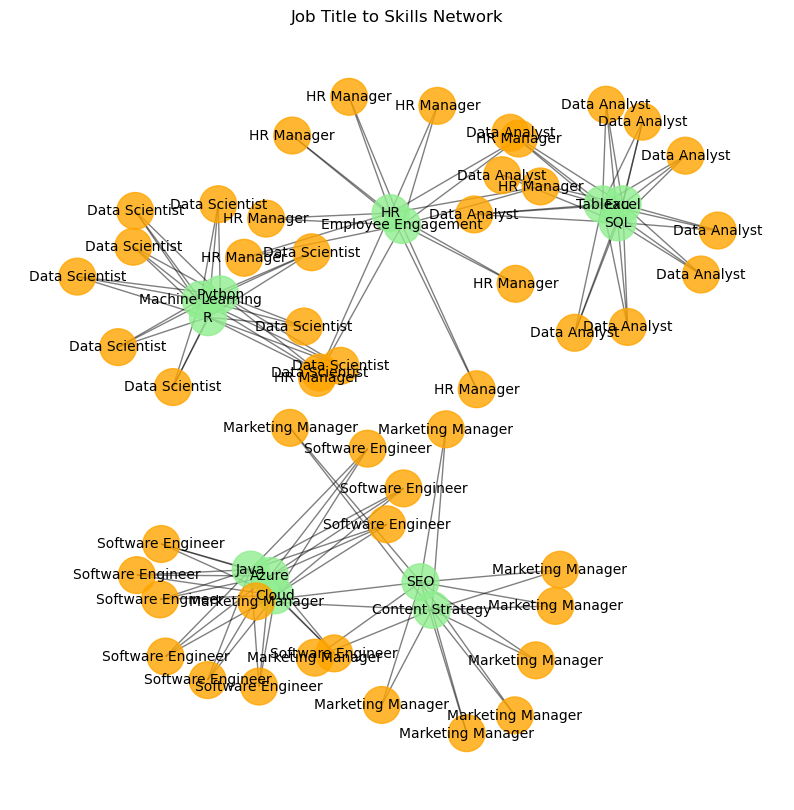

In [54]:
# Load the job postings dataset
jobs_df = pd.read_csv("C://Users//Bhargavi//Downloads//linkedin_job_postings.csv")

# Initialize a new graph for the Job Title to Skills network
G_job_skills = nx.Graph()

# Add job titles and connect them to required skills
for index, row in jobs_df.iterrows():
    job_id = row['Job ID']
    job_title = row['Job Title']
    
    # Add the job title node
    G_job_skills.add_node(job_id, label=job_title, type='job')
    
    # Add edges to required skills
    required_skills = row['Required Skills'].split(', ')
    for skill in required_skills:
        G_job_skills.add_node(skill.strip(), label=skill.strip(), type='skill')  # Add skill as a node
        G_job_skills.add_edge(job_id, skill.strip())  # Connect job title to skill

# Visualize the Job Title to Skills Network
plt.figure(figsize=(10, 10))
pos_job_skills = nx.spring_layout(G_job_skills, k=0.5, seed=42)  # Adjust layout spacing

# Draw nodes and edges
node_colors_job_skills = ['orange' if G_job_skills.nodes[node]['type'] == 'job' else 'lightgreen' for node in G_job_skills.nodes()]
nx.draw_networkx_nodes(G_job_skills, pos_job_skills, node_size=700, node_color=node_colors_job_skills, alpha=0.8)
nx.draw_networkx_edges(G_job_skills, pos_job_skills, alpha=0.5)
nx.draw_networkx_labels(G_job_skills, pos_job_skills, labels={n: G_job_skills.nodes[n]['label'] for n in G_job_skills.nodes()}, font_size=10)

plt.title('Job Title to Skills Network')
plt.axis('off')  # Turn off the axis for better visualization
plt.show()


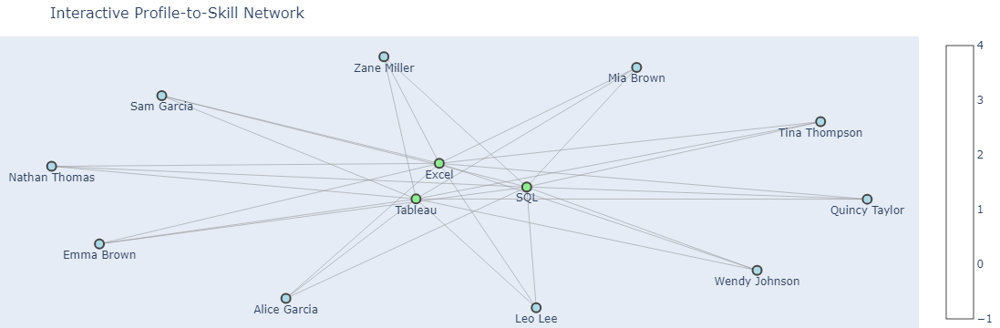

In [56]:
import plotly.graph_objects as go

# Extract node positions for Plotly
pos_plotly = nx.spring_layout(G_top_skills, k=0.5, seed=42)
edge_x = []
edge_y = []

for edge in G_top_skills.edges():
    x0, y0 = pos_plotly[edge[0]]
    x1, y1 = pos_plotly[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)  # None to separate lines
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

# Create edge trace
edges_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

# Create node traces
node_x = []
node_y = []
node_text = []
for node in G_top_skills.nodes():
    x, y = pos_plotly[node]
    node_x.append(x)
    node_y.append(y)
    node_text.append(G_top_skills.nodes[node]['label'])

nodes_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers+text',
    text=node_text,
    textposition="bottom center",
    hoverinfo='text',
    marker=dict(
        showscale=True,
        colorscale='YlGnBu',
        size=10,
        color=node_colors,
        line_width=2)
)

# Create layout
layout = go.Layout(
    title='Interactive Profile-to-Skill Network',
    titlefont_size=16,
    showlegend=False,
    hovermode='closest',
    margin=dict(l=0, r=0, t=40, b=0),
    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)
)

# Create the figure
fig = go.Figure(data=[edges_trace, nodes_trace], layout=layout)
fig.show()


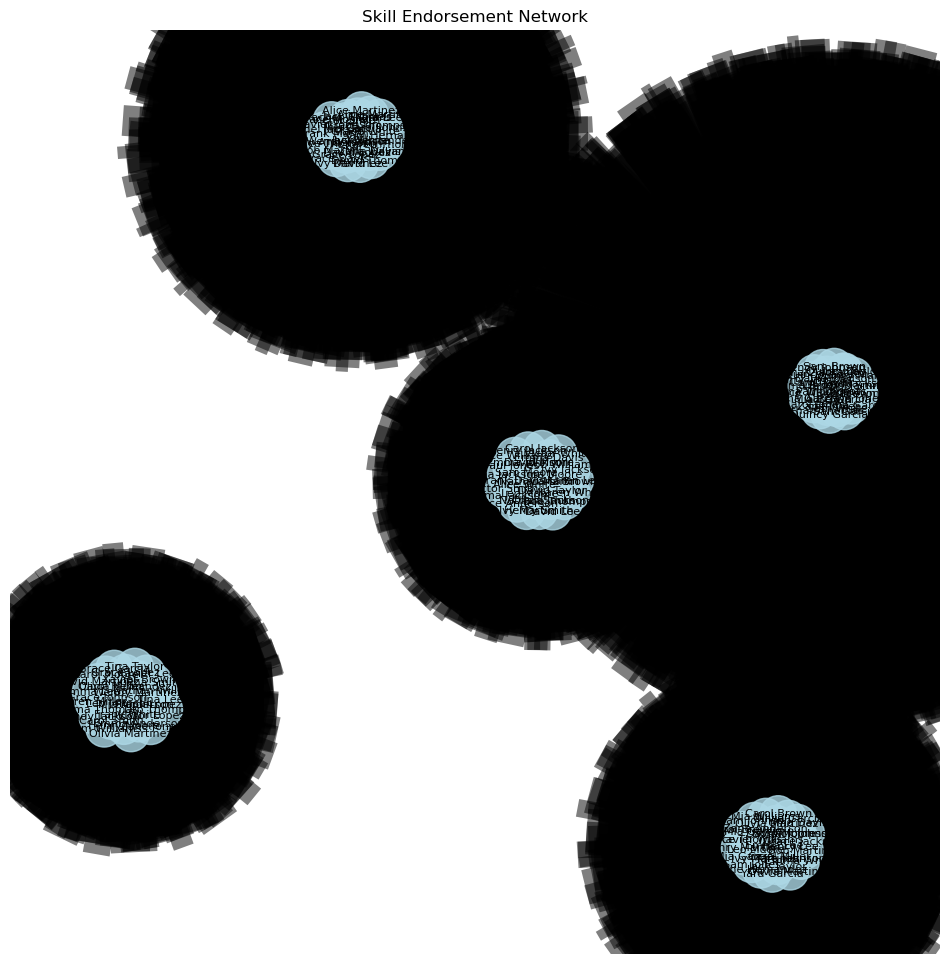

In [58]:
# Initialize a new graph for the Skill Endorsement Network
G_skill_endorsements = nx.Graph()

# Add profiles as nodes and create edges based on endorsements for shared skills
for index, row in profiles_df.iterrows():
    profile_id = row['Profile ID']
    skills = row['Skills'].split(', ')
    endorsements = row['Endorsements']
    
    # Add the profile node
    G_skill_endorsements.add_node(profile_id, label=row['Name'], type='profile', endorsements=endorsements)

    # Connect profiles that share skills with weighted edges based on endorsements
    for skill in skills:
        for other_index, other_row in profiles_df.iterrows():
            if index != other_index and skill in other_row['Skills']:
                other_profile_id = other_row['Profile ID']
                # Use endorsements as weight for the edge
                if G_skill_endorsements.has_edge(profile_id, other_profile_id):
                    G_skill_endorsements[profile_id][other_profile_id]['weight'] += endorsements
                else:
                    G_skill_endorsements.add_edge(profile_id, other_profile_id, weight=endorsements)

# Visualize the Skill Endorsement Network
plt.figure(figsize=(12, 12))
pos_skill_endorsements = nx.spring_layout(G_skill_endorsements, k=0.5, seed=42)

# Draw nodes and edges
node_colors_skill_endorsements = ['lightblue' if G_skill_endorsements.nodes[node]['type'] == 'profile' else 'gray' for node in G_skill_endorsements.nodes()]
edge_weights_skill_endorsements = [G_skill_endorsements[u][v]['weight'] for u, v in G_skill_endorsements.edges()]

nx.draw_networkx_nodes(G_skill_endorsements, pos_skill_endorsements, node_size=700, node_color=node_colors_skill_endorsements, alpha=0.8)
nx.draw_networkx_edges(G_skill_endorsements, pos_skill_endorsements, width=edge_weights_skill_endorsements, alpha=0.5)
nx.draw_networkx_labels(G_skill_endorsements, pos_skill_endorsements, labels={n: G_skill_endorsements.nodes[n]['label'] for n in G_skill_endorsements.nodes()}, font_size=8)

plt.title('Skill Endorsement Network')
plt.axis('off')  # Turn off the axis for better visualization
plt.show()


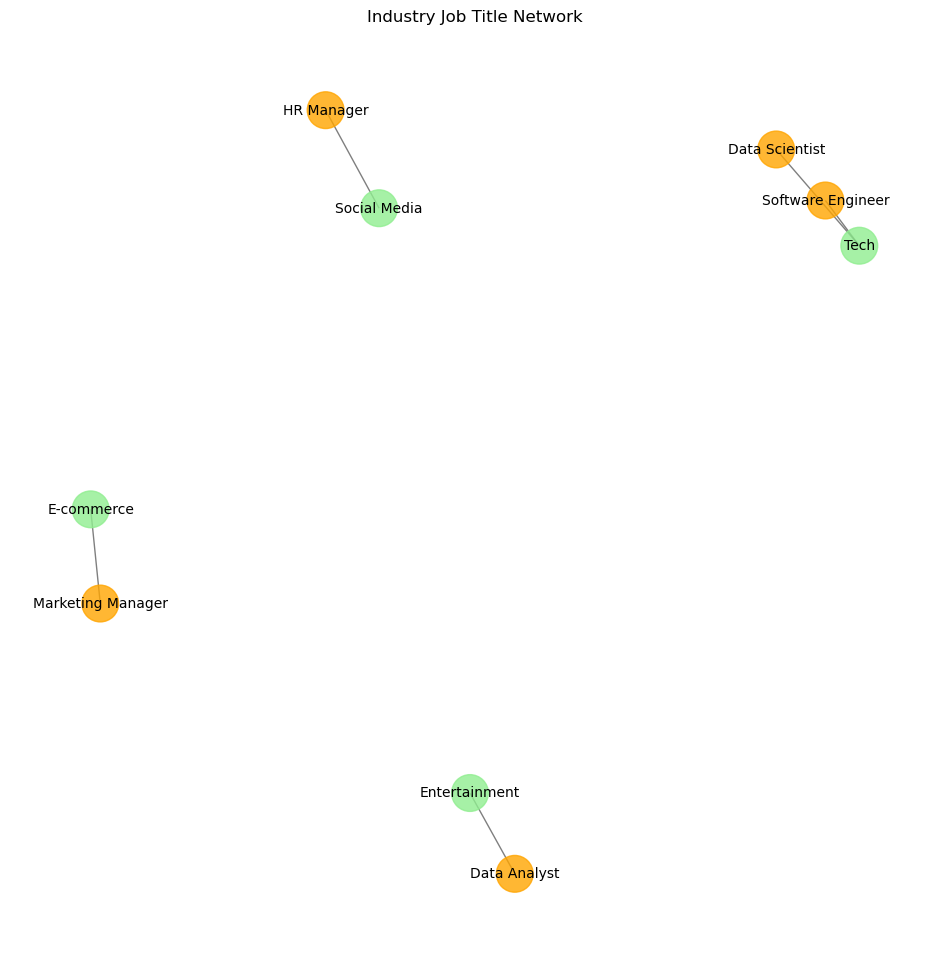

In [60]:
# Initialize a new bipartite graph for the Industry Job Title network
G_industry_job = nx.Graph()

# Add job titles and connect them to their respective industries
for index, row in jobs_df.iterrows():
    job_id = row['Job ID']
    job_title = row['Job Title']
    industry = row['Industry']
    
    # Add job title node
    G_industry_job.add_node(job_title, type='job', label=job_title)
    
    # Add industry node
    G_industry_job.add_node(industry, type='industry', label=industry)
    
    # Create an edge between the job title and its industry
    G_industry_job.add_edge(job_title, industry)

# Visualize the Industry Job Title Network
plt.figure(figsize=(12, 12))
pos_industry_job = nx.spring_layout(G_industry_job, k=0.5, seed=42)

# Draw nodes and edges
node_colors_industry_job = ['orange' if G_industry_job.nodes[node]['type'] == 'job' else 'lightgreen' for node in G_industry_job.nodes()]
nx.draw_networkx_nodes(G_industry_job, pos_industry_job, node_size=700, node_color=node_colors_industry_job, alpha=0.8)
nx.draw_networkx_edges(G_industry_job, pos_industry_job, alpha=0.5)
nx.draw_networkx_labels(G_industry_job, pos_industry_job, labels={n: G_industry_job.nodes[n]['label'] for n in G_industry_job.nodes()}, font_size=10)

plt.title('Industry Job Title Network')
plt.axis('off')  # Turn off the axis for better visualization
plt.show()


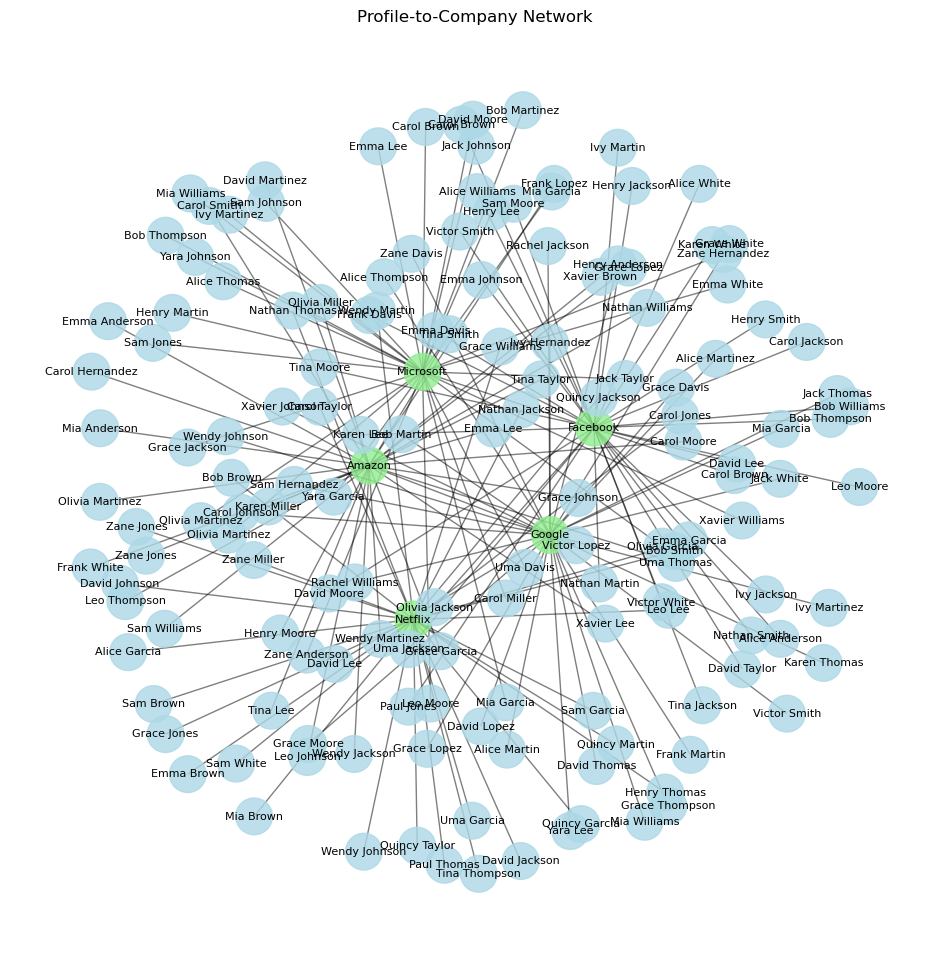

In [62]:
# Initialize a new graph for the Profile-to-Company network
G_profile_company = nx.Graph()

# Add profiles and their companies to the graph
for index, row in profiles_df.iterrows():
    profile_id = row['Profile ID']
    company = row['Company']
    
    # Add the profile node
    G_profile_company.add_node(profile_id, label=row['Name'], type='profile')
    
    # Add the company node
    G_profile_company.add_node(company, type='company', label=company)
    
    # Connect the profile to their company
    G_profile_company.add_edge(profile_id, company)

# Visualize the Profile-to-Company Network
plt.figure(figsize=(12, 12))
pos_profile_company = nx.spring_layout(G_profile_company, k=0.5, seed=42)

# Draw nodes and edges
node_colors_profile_company = ['lightblue' if G_profile_company.nodes[node]['type'] == 'profile' else 'lightgreen' for node in G_profile_company.nodes()]
nx.draw_networkx_nodes(G_profile_company, pos_profile_company, node_size=700, node_color=node_colors_profile_company, alpha=0.8)
nx.draw_networkx_edges(G_profile_company, pos_profile_company, alpha=0.5)
nx.draw_networkx_labels(G_profile_company, pos_profile_company, labels={n: G_profile_company.nodes[n]['label'] for n in G_profile_company.nodes()}, font_size=8)

plt.title('Profile-to-Company Network')
plt.axis('off')  # Turn off the axis for better visualization
plt.show()


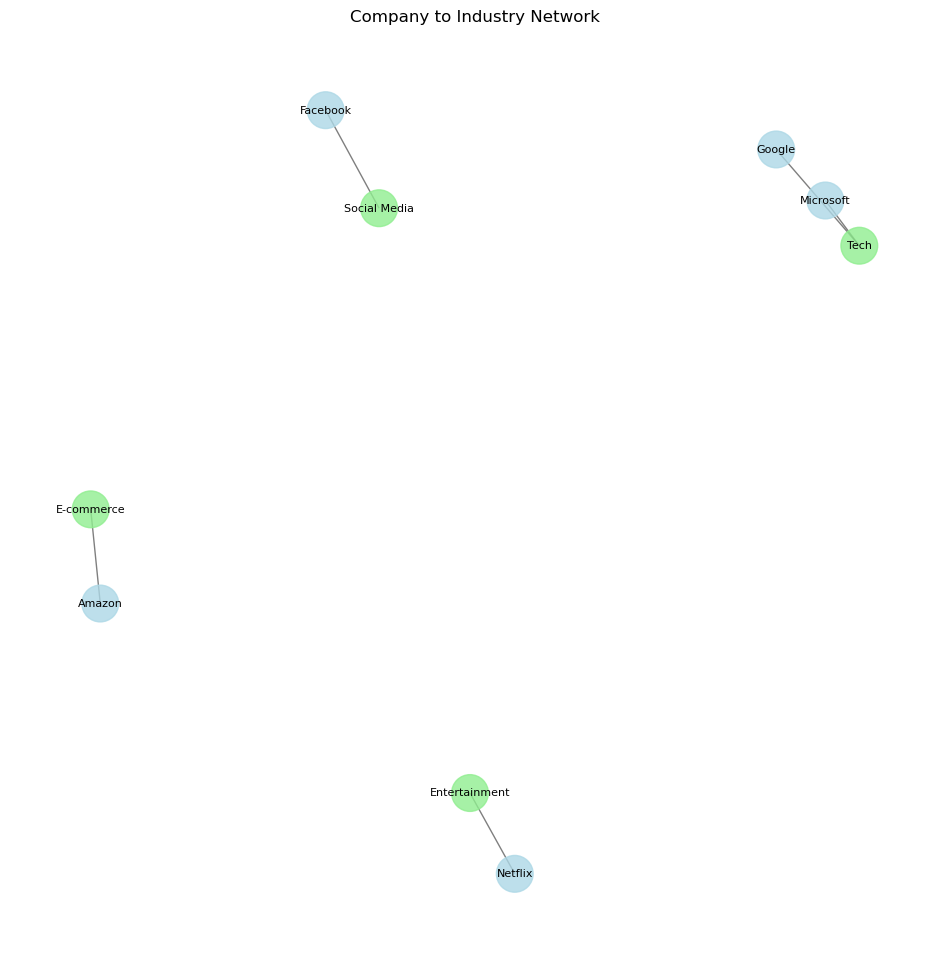

In [64]:
# Initialize a new graph for the Company to Industry network
G_company_industry = nx.Graph()

# Add companies and connect them to their respective industries
for index, row in profiles_df.iterrows():
    company = row['Company']
    industry = row['Industry']
    
    # Add company node
    G_company_industry.add_node(company, type='company', label=company)
    
    # Add industry node
    G_company_industry.add_node(industry, type='industry', label=industry)
    
    # Create an edge between the company and its industry
    G_company_industry.add_edge(company, industry)

# Visualize the Company to Industry Network
plt.figure(figsize=(12, 12))
pos_company_industry = nx.spring_layout(G_company_industry, k=0.5, seed=42)

# Draw nodes and edges
node_colors_company_industry = ['lightblue' if G_company_industry.nodes[node]['type'] == 'company' else 'lightgreen' for node in G_company_industry.nodes()]
nx.draw_networkx_nodes(G_company_industry, pos_company_industry, node_size=700, node_color=node_colors_company_industry, alpha=0.8)
nx.draw_networkx_edges(G_company_industry, pos_company_industry, alpha=0.5)
nx.draw_networkx_labels(G_company_industry, pos_company_industry, labels={n: G_company_industry.nodes[n]['label'] for n in G_company_industry.nodes()}, font_size=8)

plt.title('Company to Industry Network')
plt.axis('off')  # Turn off the axis for better visualization
plt.show()


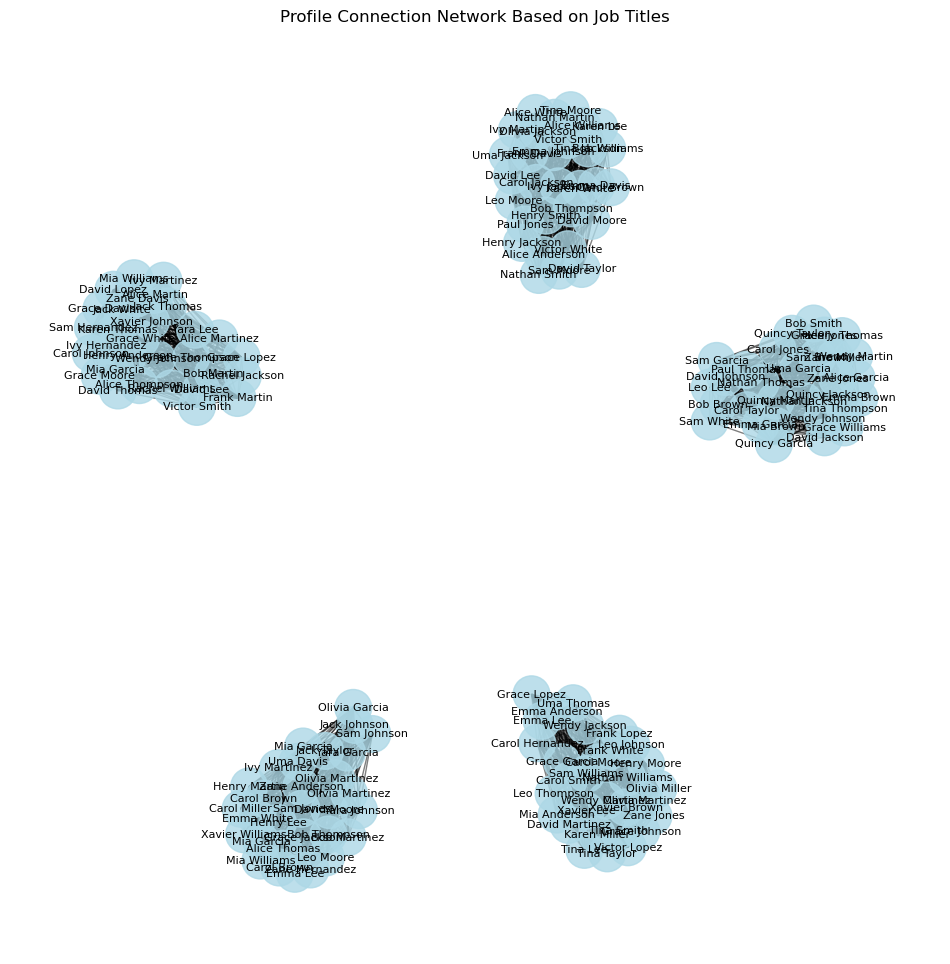

In [66]:
# Initialize a new graph for the Profile Connection network
G_profile_connections = nx.Graph()

# Add profiles as nodes
for index, row in profiles_df.iterrows():
    profile_id = row['Profile ID']
    connections = row['Connections']
    
    # Add the profile node
    G_profile_connections.add_node(profile_id, label=row['Name'], type='profile')

    # Simulate connections (since we don't have actual connection data, we can create random connections)
    # Here we simulate by connecting profiles that have similar job titles
    for other_index, other_row in profiles_df.iterrows():
        if index != other_index and row['Job Title'] == other_row['Job Title']:
            G_profile_connections.add_edge(profile_id, other_row['Profile ID'])

# Visualize the Profile Connection Network
plt.figure(figsize=(12, 12))
pos_profile_connections = nx.spring_layout(G_profile_connections, k=0.5, seed=42)

# Draw nodes and edges
node_colors_profile_connections = ['lightblue' for _ in G_profile_connections.nodes()]
nx.draw_networkx_nodes(G_profile_connections, pos_profile_connections, node_size=700, node_color=node_colors_profile_connections, alpha=0.8)
nx.draw_networkx_edges(G_profile_connections, pos_profile_connections, alpha=0.5)
nx.draw_networkx_labels(G_profile_connections, pos_profile_connections, labels={n: G_profile_connections.nodes[n]['label'] for n in G_profile_connections.nodes()}, font_size=8)

plt.title('Profile Connection Network Based on Job Titles')
plt.axis('off')  # Turn off the axis for better visualization
plt.show()


Profiles Data:
   Profile ID            Name          Job Title    Company  \
0         101      Zane Davis     Data Scientist     Google   
1         102    Sam Williams  Marketing Manager     Amazon   
2         103    Jack Johnson  Software Engineer  Microsoft   
3         104  Alice Anderson         HR Manager   Facebook   
4         105     Zane Miller       Data Analyst    Netflix   

            Location                     Skills  Endorsements Connections  \
0      New York, USA   Python, Machine Learning            75        500+   
1       Seattle, USA             Marketing, SEO            45         300   
2         London, UK      Java, Cloud Computing            60         400   
3  San Francisco, CA  HR Management, Leadership            50        500+   
4   Los Angeles, USA        SQL, Tableau, Excel            80         250   

        Industry  Experience (Years)                Education  
0           Tech                   5      MSc in Data Science  
1     E-commerc

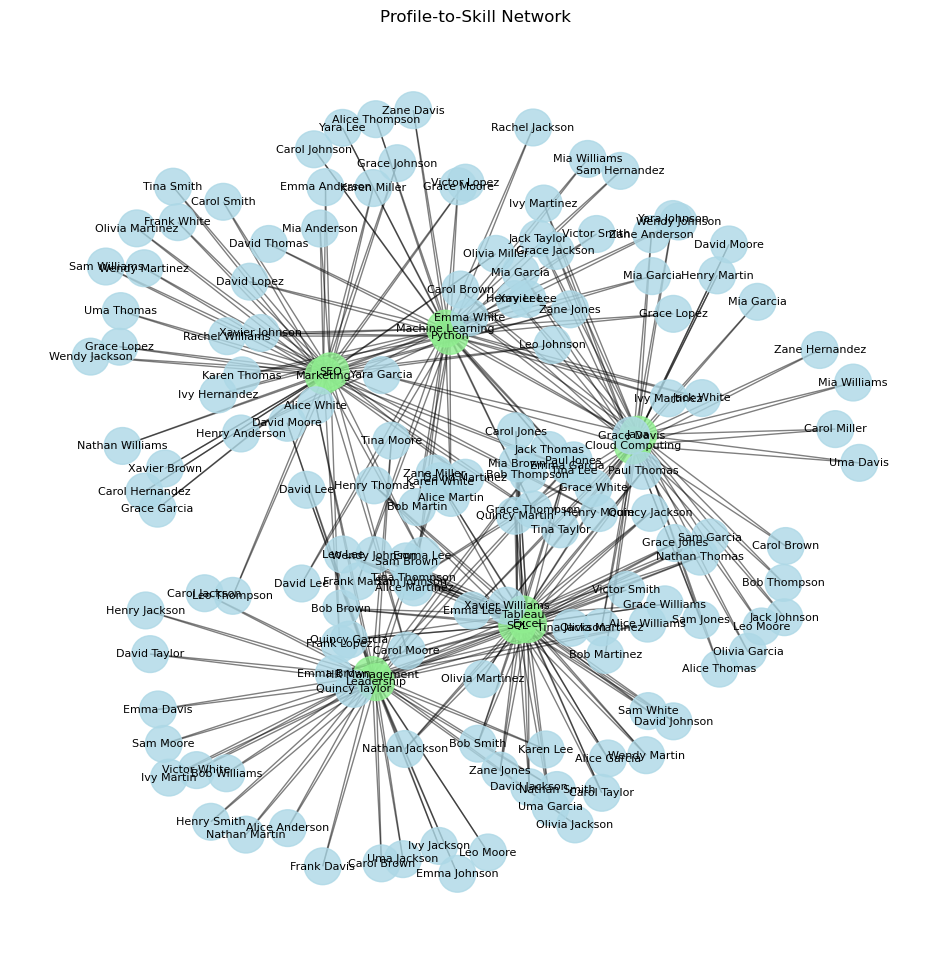

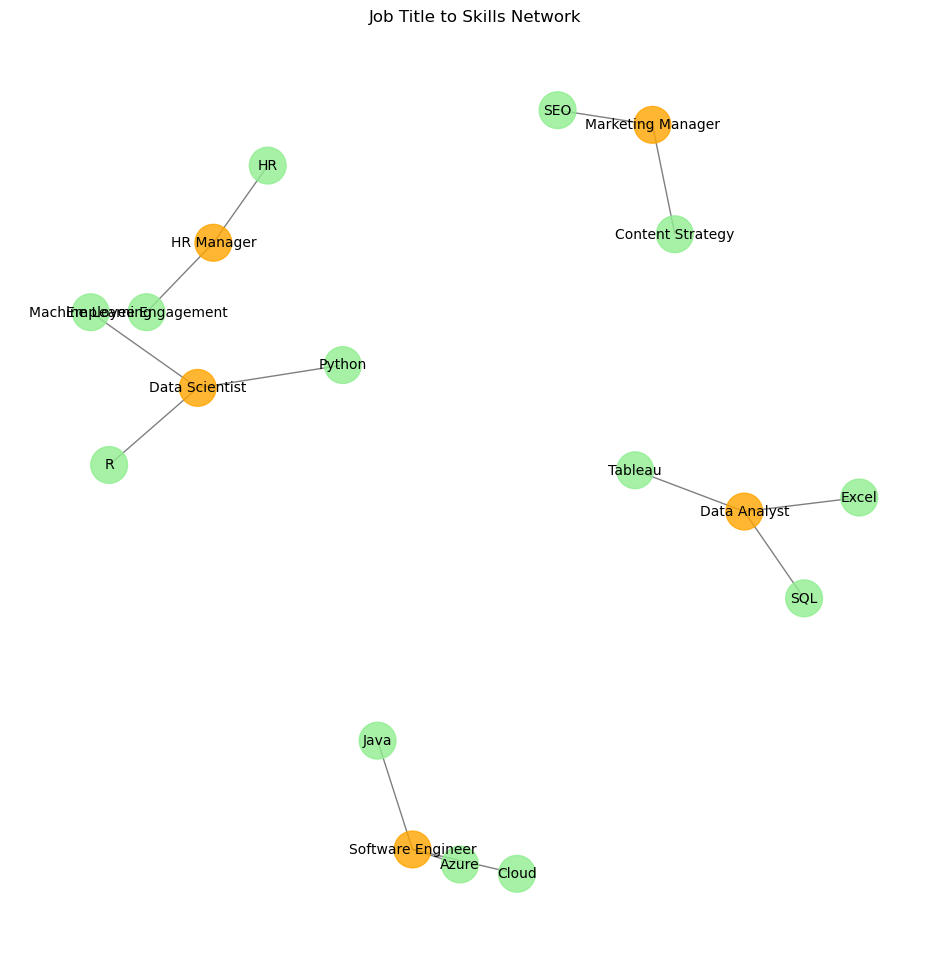

Conclusions from the LinkedIn Network Analysis:
1. The Profile-to-Skill network shows the distribution of skills across various profiles.
2. The Job Title to Skills network indicates which skills are essential for different roles.
3. High degree centrality profiles may indicate key influencers or connectors in the professional network.
4. The overall network is interconnected, suggesting that individuals often share skills across multiple job titles and industries.
5. This analysis can help guide skill development and recruitment strategies for professionals and companies.


In [70]:
# Import necessary libraries
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# Step 1: Load the Datasets
profiles_df = pd.read_csv("C://Users//Bhargavi//Downloads//linkedin_profiles.csv")
jobs_df = pd.read_csv("C://Users//Bhargavi//Downloads//linkedin_job_postings.csv")

# Display the first few rows to understand the structure of profiles and job postings
print("Profiles Data:")
print(profiles_df.head())
print("\nJobs Data:")
print(jobs_df.head())

# Check for null values in both datasets
null_values_profiles = profiles_df.isnull().sum()
null_values_jobs = jobs_df.isnull().sum()

print("\nNull values in Profiles Data:")
print(null_values_profiles)
print("\nNull values in Jobs Data:")
print(null_values_jobs)

# Step 2: Prepare the Data for Network Analysis

# Initialize the graph
G = nx.Graph()

# Step 3: Build the Profile-to-Skill Network
for index, row in profiles_df.iterrows():
    profile_id = row['Profile ID']
    skills = row['Skills'].split(', ')
    
    # Add the profile node
    G.add_node(profile_id, label=row['Name'], type='profile')
    
    # Add edges between the profile and each skill
    for skill in skills:
        G.add_node(skill.strip(), label=skill.strip(), type='skill')  # Add skill as a node
        G.add_edge(profile_id, skill.strip())  # Connect profile to the skill

# Display number of nodes and edges in the graph
print("Profile-to-Skill Network:")
print("Number of nodes:", G.number_of_nodes())
print("Number of edges:", G.number_of_edges())

# Step 4: Analyze the Network
# Calculate the degree of each node (number of connections)
degree_dict = dict(G.degree())

# Calculate degree centrality for each node
degree_centrality = nx.degree_centrality(G)

# Calculate betweenness centrality for each node
betweenness_centrality = nx.betweenness_centrality(G)

# Calculate the number of connected components in the graph
num_connected_components = nx.number_connected_components(G)

# Prepare a summary of the results
network_analysis_summary = {
    "Average Degree": sum(degree_dict.values()) / len(degree_dict),
    "Max Degree": max(degree_dict.values()),
    "Average Degree Centrality": sum(degree_centrality.values()) / len(degree_centrality),
    "Max Degree Centrality": max(degree_centrality.values()),
    "Average Betweenness Centrality": sum(betweenness_centrality.values()) / len(betweenness_centrality),
    "Max Betweenness Centrality": max(betweenness_centrality.values()),
    "Number of Connected Components": num_connected_components,
}

# Print the network analysis summary
print("\nNetwork Analysis Summary:")
for key, value in network_analysis_summary.items():
    print(f"{key}: {value}")

# Step 5: Visualize the Profile-to-Skill Network
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, k=0.5, seed=42)  # Define the layout for the graph

# Draw nodes and edges
node_colors = ['lightblue' if G.nodes[node]['type'] == 'profile' else 'lightgreen' for node in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_size=700, node_color=node_colors, alpha=0.8)
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(G, pos, labels={n: G.nodes[n]['label'] for n in G.nodes()}, font_size=8)

plt.title('Profile-to-Skill Network')
plt.axis('off')  # Turn off the axis for better visualization
plt.show()

# Step 6: Build Job Title to Skills Network
G_job_skills = nx.Graph()

# Add job titles and connect them to required skills
for index, row in jobs_df.iterrows():
    job_title = row['Job Title']
    required_skills = row['Required Skills'].split(', ')
    
    # Add job title node
    G_job_skills.add_node(job_title, type='job', label=job_title)
    
    # Add edges to required skills
    for skill in required_skills:
        G_job_skills.add_node(skill.strip(), type='skill', label=skill.strip())  # Add skill as a node
        G_job_skills.add_edge(job_title, skill.strip())  # Connect job title to skill

# Visualize the Job Title to Skills Network
plt.figure(figsize=(12, 12))
pos_job_skills = nx.spring_layout(G_job_skills, k=0.5, seed=42)

# Draw nodes and edges
node_colors_job_skills = ['orange' if G_job_skills.nodes[node]['type'] == 'job' else 'lightgreen' for node in G_job_skills.nodes()]
nx.draw_networkx_nodes(G_job_skills, pos_job_skills, node_size=700, node_color=node_colors_job_skills, alpha=0.8)
nx.draw_networkx_edges(G_job_skills, pos_job_skills, alpha=0.5)
nx.draw_networkx_labels(G_job_skills, pos_job_skills, labels={n: G_job_skills.nodes[n]['label'] for n in G_job_skills.nodes()}, font_size=10)

plt.title('Job Title to Skills Network')
plt.axis('off')  # Turn off the axis for better visualization
plt.show()

# Step 7: Conclusions from the Network Analysis
def draw_conclusions():
    print("Conclusions from the LinkedIn Network Analysis:")
    print("1. The Profile-to-Skill network shows the distribution of skills across various profiles.")
    print("2. The Job Title to Skills network indicates which skills are essential for different roles.")
    print("3. High degree centrality profiles may indicate key influencers or connectors in the professional network.")
    print("4. The overall network is interconnected, suggesting that individuals often share skills across multiple job titles and industries.")
    print("5. This analysis can help guide skill development and recruitment strategies for professionals and companies.")

# Call the function to display conclusions
draw_conclusions()


In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# Load your actual LinkedIn dataset
profiles_df = pd.read_csv("C://Users//Bhargavi//Downloads//linkedin_profiles.csv")  # Load your actual CSV file

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# Load your actual LinkedIn dataset
profiles_df = pd.read_csv("C://Users//Bhargavi//Downloads//linkedin_profiles.csv")  # Load your actual CSV file

